<a href="https://colab.research.google.com/github/CallmeQuant/Studying-Notebook/blob/main/Customer_Churn_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Environment Setups**

In [ ]:
from google.colab import drive
drive.mount("/content/drive")
from google.colab import files

Mounted at /content/drive


## **Installing Modules**

In [ ]:
%%capture
!pip install catboost
!pip install scikit-plot
# packages for survival analysis
!pip install lifelines
!pip install pysurvival
!pip install lifetimes
!pip install dtype_diet
!pip install Boruta
!pip install optuna
!pip install pycaleva

## **Importing Libraries**

In [ ]:
import pandas as pd
import numpy as np
from dtype_diet import report_on_dataframe, optimize_dtypes
from typing import *

import optuna
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.utils import shuffle
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, mutual_info_classif, f_classif
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import *
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold, StratifiedKFold

import scikitplot as skplt
import matplotlib.pyplot as plt
import seaborn as sns

# Plotting params
plot_params = {
    "font.size": 10,
    "figure.facecolor": "white",
    "axes.facecolor": "white",
    "axes.grid": False,
    "grid.linestyle": "-",
    "grid.linewidth": 0.5,
    "axes.spines.top": True,
    "axes.spines.right": True,
    "axes.labelsize": 12,
    "axes.labelweight": "bold",
    "legend.fontsize": 8,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "axes.titlesize": 12,
    "axes.titleweight": "bold",
    "figure.dpi": 150,
    "figure.constrained_layout.use": True,
    "figure.autolayout": False}

# plt.style.use("ggplot")
plt.rcParams.update(plot_params)
# plt.rcParams["font.size"] = 15
# # plt.rcParams['axes.facecolor'] = 'white'
# # Set the background color to white
# plt.rcParams['figure.facecolor'] = 'white'
# plt.rcParams['axes.facecolor'] = 'white'

# # Only show major gridlines
# plt.rcParams['axes.grid'] = True
# plt.rcParams['grid.linestyle'] = '-'
# plt.rcParams['grid.linewidth'] = 0.5

# # Only show left and bottom axes
# plt.rcParams['axes.spines.top'] = False
# plt.rcParams['axes.spines.right'] = False
COLORS = list(sns.color_palette())
import warnings
warnings.simplefilter(action='ignore', category= FutureWarning)

# **Data Processing**

## **Printing Function**

In [ ]:
# Printing information function
def print_info(info, *args):
  print(
      '-'*len(info),
      info,
      '-'*len(info),
      *args,
      sep = '\n'
  )

## **Data Loading**

In [ ]:
df = pd.read_csv("drive/My Drive/data/telco_cus_churn_data.csv")

## **Data Examining**

### **Basic Information**

The following columns serve as `features`:

+ customerID : Customer ID
gender : Whether the customer is a male or a female
+ SeniorCitizen : Whether the customer is a senior citizen or not (1, 0)
+ Partner : Whether the customer has a partner or not (Yes, No)
+ Dependents : Whether the customer has dependents or not (Yes, No)
+ tenure : Number of months the customer has stayed with the company
+ PhoneService : Whether the customer has a phone service or not (Yes, No)
+ MultipleLines : Whether the customer has multiple lines or not (Yes, No, No phone service)
+ InternetService : Customer’s internet service provider (DSL, Fiber optic, No)
+ OnlineSecurity : Whether the customer has online security or not (Yes, No, No internet service)
+ OnlineBackup : Whether the customer has online backup or not (Yes, No, No internet service)
+ DeviceProtection : Whether the customer has device protection or not (Yes, No, No internet service)
+ TechSupport : Whether the customer has tech support or not (Yes, No, No internet service)
+ StreamingTV : Whether the customer has streaming TV or not (Yes, No, No internet service)
+ StreamingMovies : Whether the customer has streaming movies or not (Yes, No, No internet service)
+ Contract : The contract term of the customer (Month-to-month, One year, Two year)
+ PaperlessBilling : Whether the customer has paperless billing or not (Yes, No)
+ PaymentMethod : The customer’s payment method (Electronic check, Mailed check, Bank transfer (automatic), Credit card (automatic))
+ MonthlyCharges : The amount charged to the customer monthly
+ TotalCharges : The total amount charged to the customer

and our `target` column:

+ Churn : Whether the customer churned or not (Yes or No)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


**Key notes:**

+ All the columns except for **Total Charges** are at least in the right data format. However, except for **customer_id** being `object` data type appropriately, other categorical features can be converted into `cateogory` data type for optimial memory usage

+ Refering to **Total Charges**, this feature is numerical so we will need to transform it into `float`. However, when we try to convert it to float directly, there is a error thrown out describing our column contains some empty strings. Since these are strings, we will convert them into `NaN` values and normally convert the **TotalCharges** into `float` using `astype` function.

In [ ]:
try:
  df['TotalCharges'].astype(float)
except ValueError as e:
  print('The error is: ' + str(e))

The error is: could not convert string to float: ' '


In [ ]:
df['TotalCharges'] = df["TotalCharges"].replace(" ", np.nan)
df['TotalCharges'] = df["TotalCharges"].astype(float)

By doing this, we can sucessfully convert **TotalCharges** into `float` type.

### **Missing Values**

In [ ]:
def create_missing_df(df):
  missing_df = df.isna().sum().to_frame(name = 'Missing')
  # missing_df['Non-missing'] = missing_df['Missing'].apply(lambda x: 100 - x)
  missing_df['Non-missing'] = len(df) - missing_df['Missing']
  missing_df['%missing'] = missing_df['Missing']*100/len(df)
  missing_df['%non-missing'] = 100 - missing_df['%missing']
  return missing_df

missing_df = create_missing_df(df)

<ipython-input-10-383c7e7104c1>:23: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


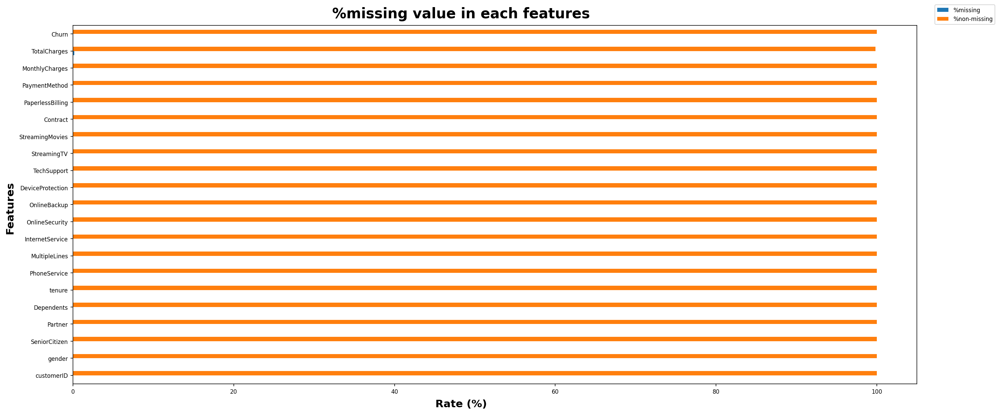

In [ ]:
A4 = (8.3, 11.7)
hfigsize = (20,10)
vfigsize = (10,20)

def create_subplots(figsize, row = 1, col = 1, sharex=True, sharey=True,):
    return plt.subplots(row, col, figsize = figsize, sharex = sharex, sharey = sharey)

fig, ax = create_subplots(figsize = (18 ,8))
fig.suptitle('%missing value in each features', fontsize = 20, fontweight = 'bold')
fig.supylabel('Features', fontsize = 15, fontweight = 'bold')
fig.supxlabel('Rate (%)', fontsize = 15, fontweight = 'bold')

missing_df[['%missing', '%non-missing']].plot.barh(ax = ax,
                                                        align = 'center',
                                                        color = COLORS[:2],
                                                        legend = False)
for ax in fig.get_axes():
    ax.label_outer()

handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, bbox_to_anchor=(1.05, 1),
           loc='upper center', borderaxespad=0)
plt.tight_layout()

In [ ]:
print_info('Number of missing values in data',
           f"Missing values across columns: {sum(df.isnull().sum())}",
           f"Missing values at column: {df.loc[:, df.isnull().any()].columns.tolist()[0]}")

--------------------------------
Number of missing values in data
--------------------------------
Missing values across columns: 11
Missing values at column: TotalCharges


As expected, since we change all empty string into `NaN` values, this introduces an extra 11 NaN values. We will inspect all columns where these values locate.

In [ ]:
df[df["TotalCharges"].isnull()]

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,NaN,No
753,3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,NaN,No
936,5709-LVOEQ,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,...,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,NaN,No
1082,4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,NaN,No
1340,1371-DWPAZ,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,NaN,No
3331,7644-OMVMY,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,NaN,No
3826,3213-VVOLG,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,NaN,No
4380,2520-SGTTA,Female,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,NaN,No
5218,2923-ARZLG,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,NaN,No
6670,4075-WKNIU,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,...,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,NaN,No


All the customers having **tenure** = 0 have null total charges which may implies that these customers have recently joined the service. In this case, we can fill those missing values with 0.

In [ ]:
df['TotalCharges'] = df['TotalCharges'].fillna(0)
df.isnull().any().any()

False

### **Data Duplication**

In [ ]:
print_info('Checking duplicated values in data',
           f'Number of duplicated values is: {df.duplicated().sum()}')

----------------------------------
Checking duplicated values in data
----------------------------------
Number of duplicated values is: 0


In [ ]:
df.drop_duplicates(inplace=True)

### **Outliers Checking using Isolation Forest**

In [ ]:
check_outlier_df = df.copy()
numeric_cols = ['tenure', 'MonthlyCharges', 'TotalCharges']
check_outlier_df = check_outlier_df[numeric_cols]

In [ ]:
from sklearn.ensemble import IsolationForest

model=IsolationForest(n_estimators=100, max_samples='auto', contamination=float(0.2),max_features=1.0)

for c in check_outlier_df.columns:
  model.fit(check_outlier_df[[c]])
  col_score = 'scores' + str(c)
  check_outlier_df[col_score]=model.decision_function(check_outlier_df[[c]])
  col_anomaly = 'anomaly' + str(c)
  check_outlier_df[col_anomaly]=model.predict(check_outlier_df[[c]])

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


In [ ]:
anomaly_col = check_outlier_df.loc[:, check_outlier_df.columns.str.contains('anomaly')].columns.tolist()
cond = (check_outlier_df[anomaly_col[0]] == -1) | (check_outlier_df[anomaly_col[1]] == -1) | (check_outlier_df[anomaly_col[2]] == -1)
anomaly = check_outlier_df.loc[cond]
print(anomaly)

      tenure  MonthlyCharges  TotalCharges  scorestenure  anomalytenure  \
0          1           29.85         29.85      0.040687              1   
3         45           42.30       1840.75     -0.001950             -1   
7         10           29.75        301.90      0.015339              1   
9         62           56.15       3487.95     -0.003848             -1   
11        16           18.95        326.80      0.008217              1   
...      ...             ...           ...           ...            ...   
7034      67          102.95       6886.25     -0.021332             -1   
7037      72           21.15       1419.40      0.001280              1   
7039      72          103.20       7362.90      0.001280              1   
7040      11           29.60        346.45      0.009561              1   
7042      66          105.65       6844.50     -0.008216             -1   

      scoresMonthlyCharges  anomalyMonthlyCharges  scoresTotalCharges  \
0                -0.079277

### **Outliers Checking Using Tukey IQR**

In [ ]:
def IQR_outlier_detection(df: pd.DataFrame, n: int, features: List):
  """
  Given a dataframe including features columns, extract the index
  of an observation considered to be an outlier based on Tukey IQR method

  Returns
  -------
  index_list: List
  """
  outlier = []

  for col in features:
    # 1st quartile (25%)
    Q1 = np.percentile(df[col], 25)
    # 3rd quartile (75%)
    Q3 = np.percentile(df[col],75)
    # Interquartile range (IQR)
    IQR = Q3 - Q1
    # outlier step
    outlier_step = 1.5 * IQR
    # Determining a list of indices of outliers
    outlier_col = df[(df[col] < Q1 - outlier_step) | (df[col] > Q3 + outlier_step )].index
    # appending the list of outliers
    outlier.extend(outlier_col)

  outlier = Counter(outlier)
  mul_outliers = list( k for k, v in outlier.items() if v > n )

  lower_outlier = df[df[col] < Q1 - outlier_step]
  upper_outlier = df[df[col] > Q3 + outlier_step]

  print_info('Outlier Detection with IQR method',
             f'Number of outliers removed: {lower_outlier.shape[0] + upper_outlier.shape[0]}')

  return mul_outliers

def find_boundaries(col: pd.Series, whisker_coeff: float = 1.5
) -> Tuple[float, float]:
    Q1 = col.quantile(0.25)
    Q3 = col.quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - whisker_coeff * IQR
    upper = Q3 + whisker_coeff * IQR
    return lower, upper

class IQRClipper(BaseEstimator, TransformerMixin):
    def __init__(self, whisker_coeff: float = 1.5):
        self.whisker = whisker_coeff
        self.lower = None
        self.upper = None

    def fit(self, X: pd.Series):
        self.lower, self.upper = find_boundaries(X, self.whisker)
        return self

    def transform(self, X):
        return X.clip(self.lower, self.upper)

In [ ]:
IQR_detect = IQR_outlier_detection(df, 1, numeric_cols)
df_out = df.drop(IQR_detect, axis = 0).reset_index(drop=True)

---------------------------------
Outlier Detection with IQR method
---------------------------------
Number of outliers removed: 0


Using IQR method gives us a complete data with no outliers removing, while Isolation Forest is more sensitive to the change of the values. Moreover, we also need to take into account the **nature of the data** since we can remove the underlying pattern if irresponsibly remove these outliers.

## **Data Preparation for EDA**

We will do the following steps to prepare data for EDA and further modeling:

+ Dropping the **customerID** column since it does not provide any predictive capability.
+ Optimizing dataframe memory usage.
+ Creating a deepcopy of dataset and label encoding for categorical features

In [ ]:
df.drop(columns = ['customerID'], inplace = True)

In [ ]:
proposed_df = report_on_dataframe(df, unit="MB")
opt_df = optimize_dtypes(df, proposed_df)
print_info("Dataframe Memory Optimize",
           f'Original df memory: {df.memory_usage(deep=True).sum()/1024/1024} MB',
           f'Propsed df memory: {opt_df.memory_usage(deep=True).sum()/1024/1024} MB',
           f'Reduction proportion: {100 * (df.memory_usage(deep=True).sum()/1024/1024) / (opt_df.memory_usage(deep=True).sum()/1024/1024)}%')

print(opt_df.info())

-------------------------
Dataframe Memory Optimize
-------------------------
Original df memory: 7.275142669677734 MB
Propsed df memory: 0.538447380065918 MB
Reduction proportion: 1351.133451292324%
<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   gender            7043 non-null   category
 1   SeniorCitizen     7043 non-null   int8    
 2   Partner           7043 non-null   category
 3   Dependents        7043 non-null   category
 4   tenure            7043 non-null   int8    
 5   PhoneService      7043 non-null   category
 6   MultipleLines     7043 non-null   category
 7   InternetService   7043 non-null   category
 8   OnlineSecurity    7043 non-null   category
 9   OnlineBackup      7043 non-null   category
 10  DeviceProtection  7043 non-null   category
 11  TechSupport       7043 non-null   category
 12  StreamingTV     

We are able to save nearly 7MB by downcasting the data types used.

In [ ]:
le = LabelEncoder()

df1 = opt_df.copy(deep = True)
num_feats = opt_df.select_dtypes(include=np.number).columns
cat_feats = [i for i in list(opt_df.columns) if i not in list(opt_df.describe().columns)]

print('Label Encoder Transformation')
for i in cat_feats :
    df1[i] = le.fit_transform(df1[i])
    print_info(i,' : ',df1[i].unique(),' = ', le.inverse_transform(df1[i].unique()))

Label Encoder Transformation
------
gender
------
 : 
[0 1]
 = 
['Female' 'Male']
-------
Partner
-------
 : 
[1 0]
 = 
['Yes' 'No']
----------
Dependents
----------
 : 
[0 1]
 = 
['No' 'Yes']
------------
PhoneService
------------
 : 
[0 1]
 = 
['No' 'Yes']
-------------
MultipleLines
-------------
 : 
[1 0 2]
 = 
['No phone service' 'No' 'Yes']
---------------
InternetService
---------------
 : 
[0 1 2]
 = 
['DSL' 'Fiber optic' 'No']
--------------
OnlineSecurity
--------------
 : 
[0 2 1]
 = 
['No' 'Yes' 'No internet service']
------------
OnlineBackup
------------
 : 
[2 0 1]
 = 
['Yes' 'No' 'No internet service']
----------------
DeviceProtection
----------------
 : 
[0 2 1]
 = 
['No' 'Yes' 'No internet service']
-----------
TechSupport
-----------
 : 
[0 2 1]
 = 
['No' 'Yes' 'No internet service']
-----------
StreamingTV
-----------
 : 
[0 2 1]
 = 
['No' 'Yes' 'No internet service']
---------------
StreamingMovies
---------------
 : 
[0 2 1]
 = 
['No' 'Yes' 'No internet service']

### **Descriptive Statistics on Encoded Dataset**

We will examine some fundamental descriptive statistics of our new transformed dataset.

In [ ]:
churn = df1[df1['Churn'].eq(1)].describe().T
not_churn = df1[df1['Churn'].eq(0)].describe().T

<ipython-input-25-2d07936d4de1>:15: UserWarning: The figure layout has changed to tight
  fig.tight_layout(pad = 0)


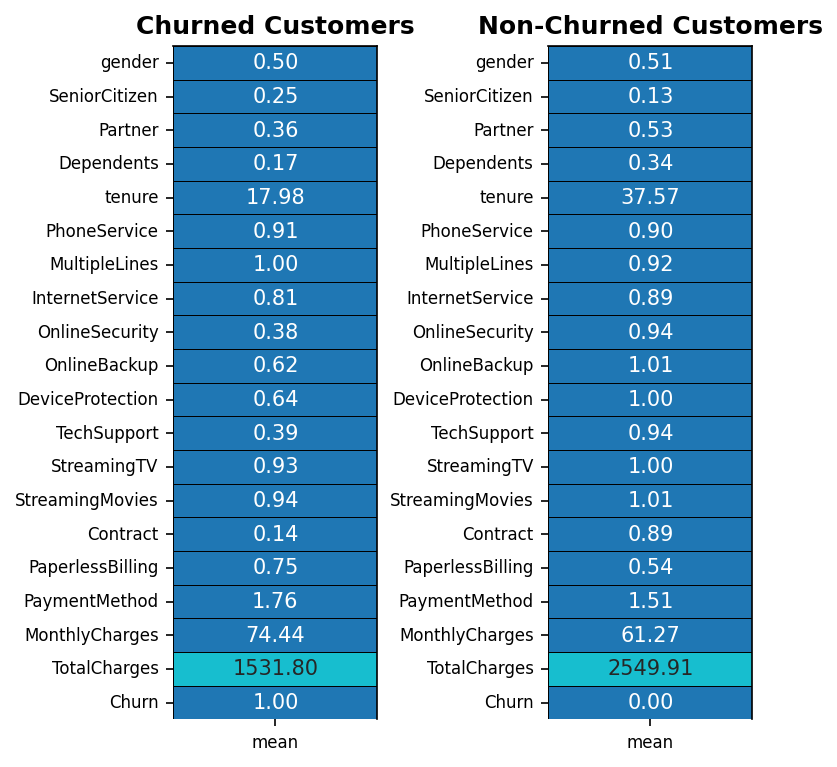

In [ ]:
fig, ax = plt.subplots(nrows = 1,ncols = 2, figsize = (5,5))

sns.heatmap(churn[['mean']], annot = True, cmap = COLORS, linewidths = 0.4,
            linecolor = 'black', cbar = False,
            fmt = '.2f', ax = ax[0])
ax[0].set_title('Churned Customers', fontsize = 12)
ax[0].spines[['top', 'right']].set_visible(True)

sns.heatmap(not_churn[['mean']],annot = True, cmap = COLORS,
            linewidths = 0.4, linecolor = 'black',
            cbar = False,fmt = '.2f', ax = ax[1])
ax[1].set_title('Non-Churned Customers', fontsize = 12)
ax[1].spines[['top', 'right']].set_visible(True)

fig.tight_layout(pad = 0)


We visualize the *mean* values of all the features categorized by churned and non-churned customers. Some key findings are listed belows:

+ Churned customers have a low average tenure of 17.98 months as compared to those who continued with a mean tenure period of 37.57 months.

+ Customer services like **OnlineSecurity**, **OnlineBackup**, **DeviceProtection**, and **TechSupport** are higher for non-churned clients than those are churned. These features can be effectively incorported into our model.

+ Churned customer's **Contract** value is much smaller than those of non-churned customers.

+ Mean **MonthlyCharges** of the churn customers, 74.44, is more than that of not-churn customers, 61.27.

+ Non-churned customers **TotalCharges**, 2557.31, is higher than churn customers, 1531.80.

From our first glance at these mean values, we can speculate that some features display a strongly predictive power that may assist us to identify the underlying factors that drive the customer churn. Therefore, by further scrutinizing and accomodating these components, we can efficiently help retain the clients' loyalty to services.

## **EDA**


At this step, we will explore deeper into our feature space. First, we will divide the features into two subtypes: `numerical` and `categorical`

We split the features based on the following heuristic criteria: if one feature has less than 6 unique items we classify it to `categorial` else `numerical`. A more formal way is to based on the datatype, for example if datatype is integer or float then the corresponding feature will be `numerical`.



In [ ]:
col = list(df1.columns)
categorical_features = []
numerical_features = []
for i in col:
    if len(opt_df[i].unique()) > 6:
        numerical_features.append(i)
    else:
        categorical_features.append(i)

print_info('Features categorization',
           'Categorical Features :\n', *categorical_features,
           '\n'
           'Numerical Features :\n', *numerical_features)

-----------------------
Features categorization
-----------------------
Categorical Features :

gender
SeniorCitizen
Partner
Dependents
PhoneService
MultipleLines
InternetService
OnlineSecurity
OnlineBackup
DeviceProtection
TechSupport
StreamingTV
StreamingMovies
Contract
PaperlessBilling
PaymentMethod
Churn

Numerical Features :

tenure
MonthlyCharges
TotalCharges


### **Target Variable: Churn**

As anticipated, the dataset is unbalanced with the number of churn customers being tripled its counterpart.

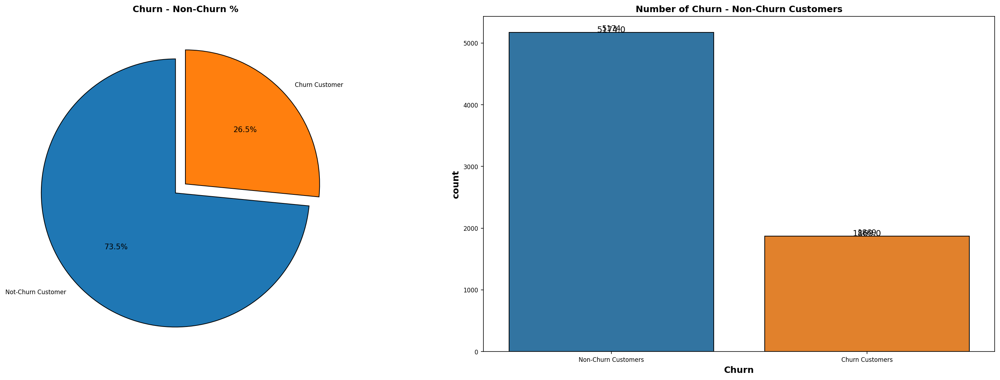

In [ ]:
l = list(df1['Churn'].value_counts())
circle = [l[0] / sum(l) * 100,l[1] / sum(l) * 100]

fig = plt.subplots(nrows = 1,ncols = 2,figsize = (20, 7))

plt.subplot(1,2,1)
plt.pie(circle,labels = ['Not-Churn Customer','Churn Customer'],
        autopct = '%1.1f%%',startangle = 90,explode = (0.1,0),colors = COLORS,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('Churn - Non-Churn %')

plt.subplot(1,2,2)
ax = sns.countplot(data = opt_df, x = 'Churn', palette = COLORS,
                   edgecolor = 'black')
for rect in ax.patches:
    ax.text(rect.get_x() + rect.get_width() / 2, rect.get_height() + 2, rect.get_height(), horizontalalignment='center', fontsize = 11)

for i in ax.containers:
    ax.bar_label(i,)
ax.set_xticklabels(['Non-Churn Customers','Churn Customers'])

plt.title('Number of Churn - Non-Churn Customers')
plt.show()

### **Categorical Features**

We will visualize the relationship between categorical features and the churn variable. First, we will remove the target variable from the caterogical variable list for visualization purpose

In [ ]:
categorical_features.remove('Churn')

We notice that there are 16 categorical features which would be make it lengthy to go through all of them. Therefore, it is reasonable to first group some of these features based on their characteristics and then perform visualization group by group.

We divide 16 features into 3 groups: Clients' Information, Subscribed Services and Payment Method.

In [ ]:
l1 = ['gender','SeniorCitizen','Partner','Dependents'] # Customer Information
l2 = ['PhoneService','MultipleLines','InternetService','StreamingTV','StreamingMovies',
      'OnlineSecurity','OnlineBackup','DeviceProtection','TechSupport'] # Services Signed Up for!
l3 = ['Contract','PaperlessBilling','PaymentMethod'] # Payment Information

#### **Group 1: Clients' Information**
Gender | SeniorCitizen | Partner | Dependents

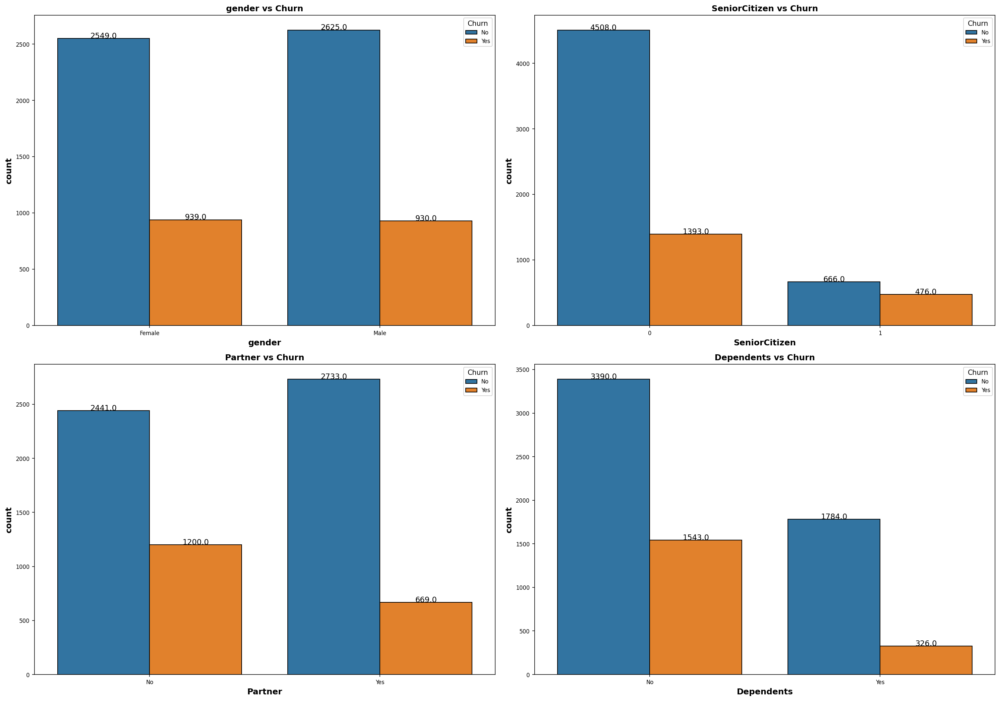

In [ ]:
fig = plt.subplots(nrows = 2,ncols = 2,figsize = (20,14))
for i in range(len(l1)):
    plt.subplot(2,2,i+1)
    ax = sns.countplot(data = opt_df, x = l1[i], hue = "Churn",palette = COLORS, edgecolor = 'black')
    for rect in ax.patches:
        ax.text(rect.get_x() + rect.get_width() / 2, rect.get_height() + 2, rect.get_height(), horizontalalignment='center', fontsize = 11)
    title = l1[i] + ' vs Churn'
    plt.title(title)

+ Gender does not give us any discriminative power between churn and non-churn customers. This reflects through customer churning for **male** & **female** customers is pretty similar.

+ In the same way, number of **SeniorCitizen** customers is extremely low with 40% of which (476) out of (1142) being categorized as churn.

+ Customers who are housing with a **Partner** churned less as compared to those not living with a **Partner**.

+ Similarly, churn is high for customers that do not have **Dependents** with them.

One more thing I want to point out that by observing the name between **Dependents** and **Partner**, we speculate that there may be a correlation since these two features represents very identical meanings. We will give it a check later on the **Feature Engineering** section.

#### **Group 2: Services Subscribed**
PhoneService | MultipleLines | InternetService | StreamingTV | StreamingMovies |

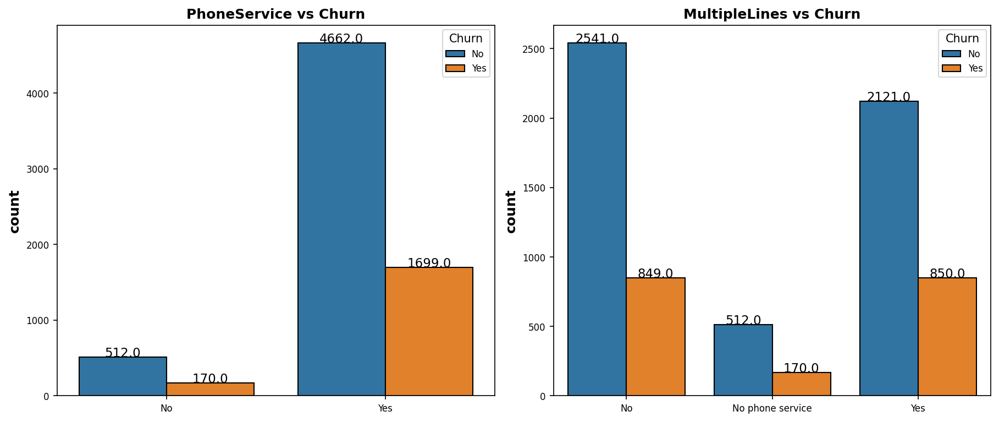

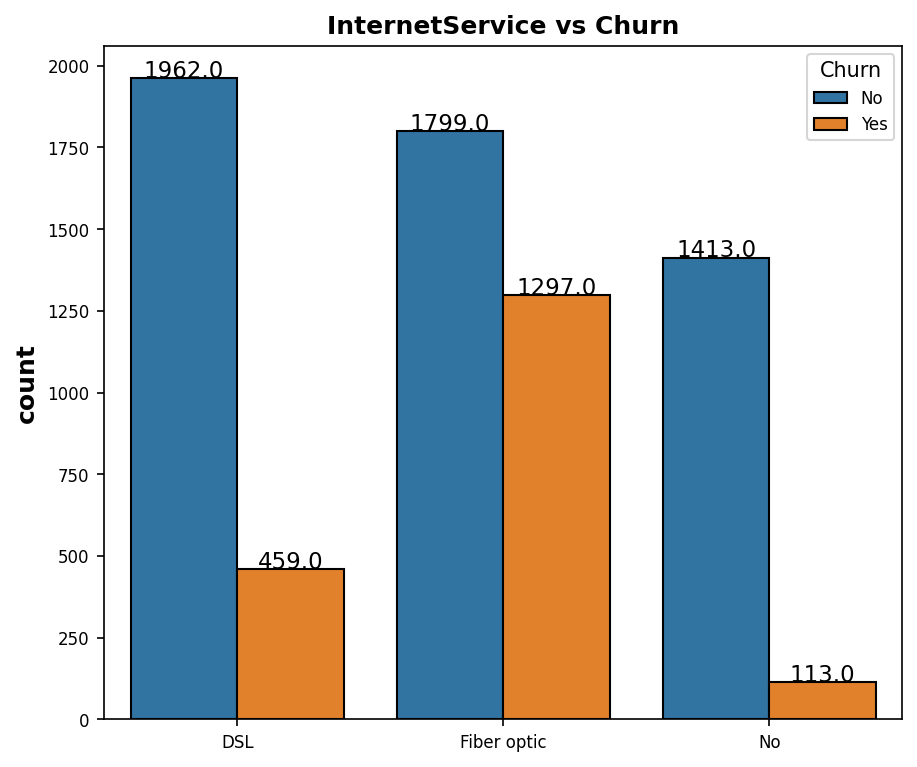

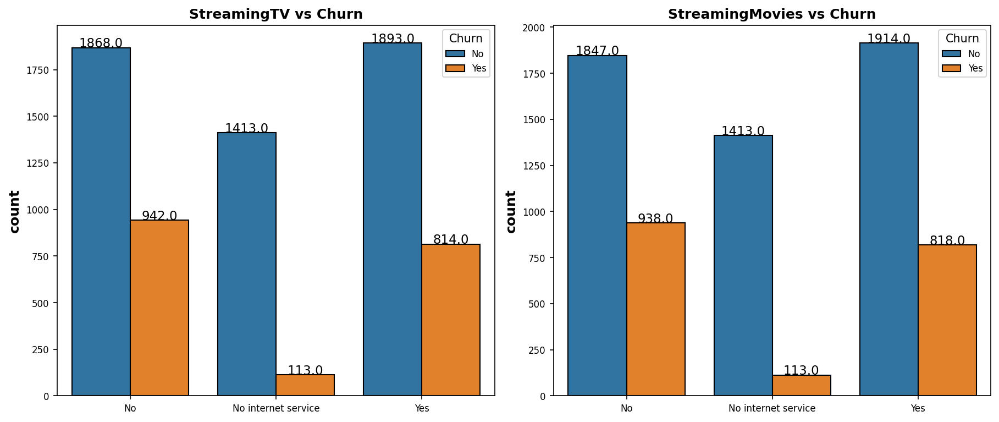

In [ ]:
fig = plt.subplots(nrows = 1,ncols = 2,figsize = (12,5))

for i in range(len(l2[0:2])):
    plt.subplot(1,2,i + 1)
    ax = sns.countplot(data = opt_df, x = l2[i], hue = "Churn",palette = COLORS,edgecolor = 'black')
    for rect in ax.patches:
        ax.text(rect.get_x() + rect.get_width() / 2, rect.get_height() + 2, rect.get_height(), horizontalalignment='center', fontsize = 11)
    title = l2[i] + ' vs Churn'
    plt.xlabel('')
    plt.title(title)

fig = plt.subplots(nrows = 1, ncols = 1, figsize = (6,5))

plt.subplot(1,1,1)
ax = sns.countplot(data = opt_df, x = l2[2], hue = "Churn", palette = COLORS,edgecolor = 'black')
for rect in ax.patches:
    ax.text(rect.get_x() + rect.get_width() / 2, rect.get_height() + 2, rect.get_height(), horizontalalignment='center', fontsize = 11)
title = l2[2] + ' vs Churn'
plt.xlabel('')
plt.title(title)

fig = plt.subplots(nrows = 1,ncols = 2,figsize = (12,5))

for i in range(len(l2[3:5])):
    plt.subplot(1,2,i + 1)
    ax = sns.countplot(data = opt_df, x = l2[i + 3], hue = "Churn",palette = COLORS,edgecolor = 'black')
    for rect in ax.patches:
        ax.text(rect.get_x() + rect.get_width() / 2, rect.get_height() + 2, rect.get_height(), horizontalalignment='center', fontsize = 11)
    title = l2[i + 3] + ' vs Churn'
    plt.xlabel('')
    plt.title(title)

+ For **PhoneService**, even without phone service, a larger number of customers chose to continue with their existing services, as opposed to those who decided to discontinue their services.

+ In case of **MultipleLines**, churn rate in which the **Multiplelines** are present or not is the same.

+ A significant proportion of customers have shown reluctance to adopt **Fiber optic** cables as their Internet service medium. However, as indicated in the aforementioned graph, **DSL** is the preferred choice for Internet service among customers.

+ The graphs for **StreamingTV** and **StreamingMovies** are identical.Nonetheless, a substantial number of customers discontinued their services regardless of whether they were subscribed to **StreamingTV** & **StreamingMovies**. This suggests that the streaming content may not have been the primary reason for customer churn.

#### **Group 2: Services Subscribed**
OnlineSecurity | OnlineBackup | DeviceProtection | TechSupport |

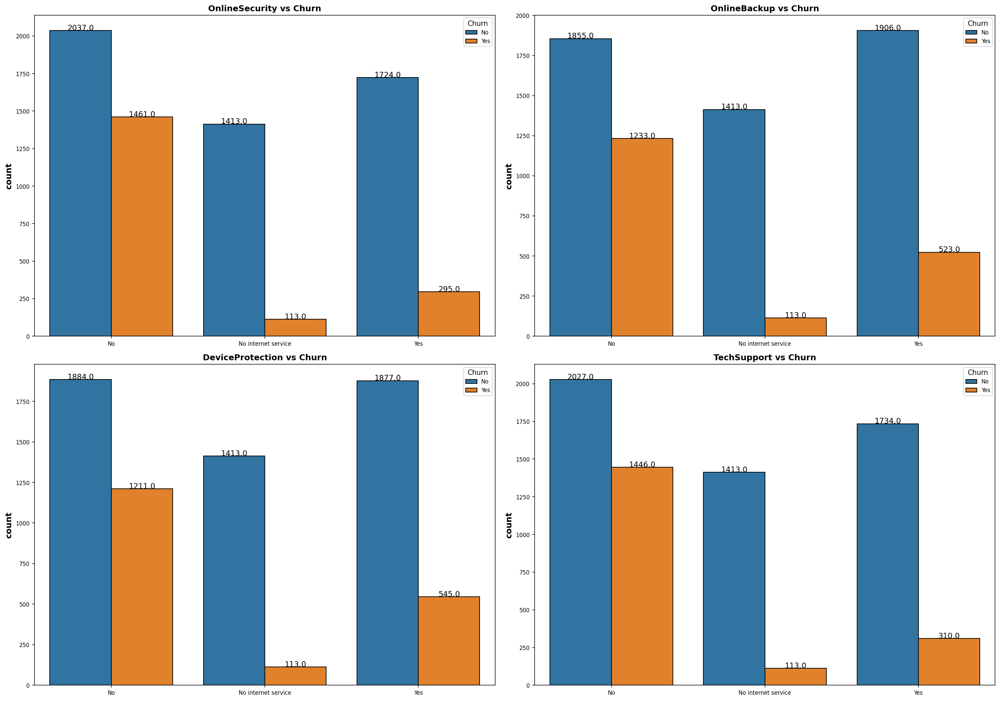

In [ ]:
fig = plt.subplots(nrows = 2, ncols = 2,figsize = (20,14))
for i in range(len(l2[-4:])):
    plt.subplot(2,2,i + 1)
    ax = sns.countplot(data = opt_df, x = l2[-4 + i], hue = "Churn",palette = COLORS,edgecolor = 'black')
    for rect in ax.patches:
        ax.text(rect.get_x() + rect.get_width() / 2, rect.get_height() + 2, rect.get_height(), horizontalalignment='center', fontsize = 11)
    title = l2[-4 + i] + ' vs Churn'
    plt.xlabel('')
    plt.title(title)

+ Indeed, from the visualizations, it's clear that services related to **OnlineSecurity**, **OnlineBackup**, **DeviceProtection**, and **TechSupport** play a pivotal role in customer satisfaction. These services are vital in retaining customers and enhancing their experience.

+ A large number of customers have opted to change their service provider due to poor performance in the aforementioned features. It's clear that these services are critical in maintaining customer loyalty and satisfaction.

#### **Group 3: Payment Method**
Contract | PaperlessBilling | PaymentMethod |

Text(0.5, 1.0, 'PaymentMethod vs Churn')

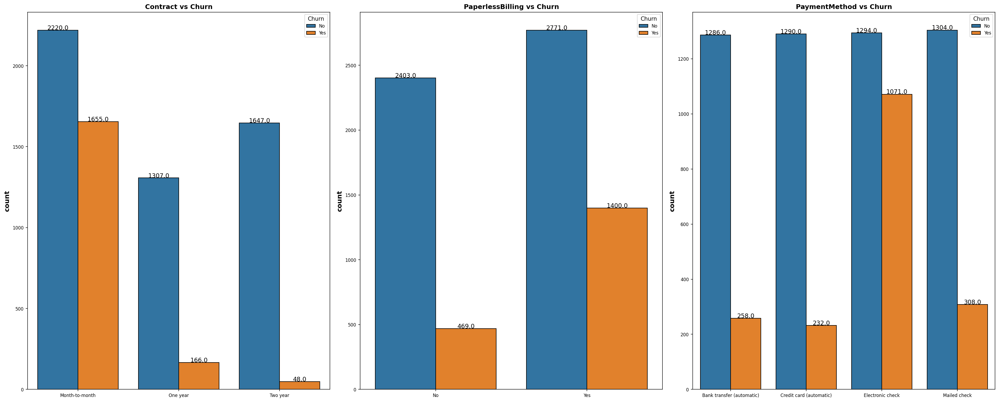

In [ ]:
fig = plt.subplots(nrows = 1,ncols = 3,figsize = (25,10))

plt.subplot(1,3,1)
ax = sns.countplot(data = opt_df, x = l3[0], hue = "Churn",palette = COLORS, edgecolor = 'black')
for rect in ax.patches:
    ax.text(rect.get_x() + rect.get_width() / 2, rect.get_height() + 2, rect.get_height(), horizontalalignment='center', fontsize = 11)
title = l3[0] + ' vs Churn'
plt.xlabel('')
plt.title(title)

plt.subplot(1,3,2)
ax = sns.countplot(data = opt_df, x = l3[1], hue = "Churn",palette = COLORS, edgecolor = 'black')
for rect in ax.patches:
    ax.text(rect.get_x() + rect.get_width() / 2, rect.get_height() + 2, rect.get_height(), horizontalalignment='center', fontsize = 11)
title = l3[1] + ' vs Churn'
plt.xlabel('')
plt.title(title)

plt.subplot(1,3,3)
ax = sns.countplot(data = opt_df, x = l3[2], hue = "Churn",palette = COLORS, edgecolor = 'black')
for rect in ax.patches:
    ax.text(rect.get_x() + rect.get_width() / 2, rect.get_height() + 2, rect.get_height(), horizontalalignment='center', fontsize = 11)
title = l3[2] + ' vs Churn'
plt.xlabel('')
plt.title(title)

+ The churn rate for customers on a **Month-to-Month** contract appears to be quite high. This could be due to customers trying out different services to see which one suits their needs best. By opting for a one-month contract, they can explore various options without committing long-term, thereby potentially saving money.

+ Absolutely, the overall experience with the internet service, streaming service, and phone service was inconsistent. As every customer has different priorities, if one of these three services doesn't meet their expectations, they might choose to discontinue the entire service. This highlights the importance of maintaining a high standard across all services.

+ A high churn rate among customers using **PaperlessBilling** could be indicative of issues related to payments or receipts. It's crucial for service providers to ensure a smooth and hassle-free billing process to maintain customer satisfaction and loyalty.

+ The data suggests that customers have had a negative experience with the **Electronic check PaymentMethod**. Out of the 2365 bills paid using this method, a significant number of 1071 customers chose to discontinue their services. This indicates a clear dissatisfaction with this payment method. The company should indeed consider either discontinuing the **Electronic check** method or improving its user-friendliness and reliability to prevent further customer churn.

### **Categorical Features vs Target Variable**

At this stage, we will focus on the customers who have churned. Understanding their behavior and the reasons for their departure can provide valuable insights for improving services and reducing churn in the future. We start first with categorical features and later with numerical features.

#### **Group 1: Clients' Information**
Gender | SeniorCitizen | Partner | Dependents

In [ ]:
gender = df1[df1['Churn'] == 1]['gender'].value_counts()
gender = [gender[0] / sum(gender) * 100, gender[1] / sum(gender) * 100] # Female - Male

seniorcitizen = df1[df1['Churn'] == 1]['SeniorCitizen'].value_counts()
seniorcitizen = [seniorcitizen[0] / sum(seniorcitizen) * 100,seniorcitizen[1] / sum(seniorcitizen) * 100] # No - Yes

partner = df1[df1['Churn'] == 1]['Partner'].value_counts()
partner = [partner[0] / sum(partner) * 100,partner[1] / sum(partner) * 100] # No - Yes

dependents = df1[df1['Churn'] == 1]['Dependents'].value_counts()
dependents = [dependents[0] / sum(dependents) * 100,dependents[1] / sum(dependents) * 100] # No - Yes

Text(0.5, 1.0, 'Dependents')

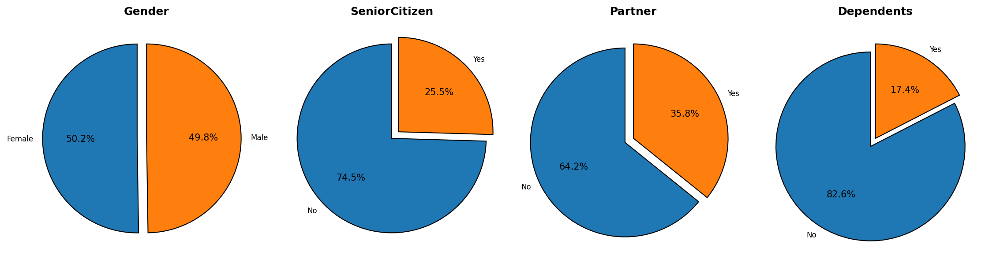

In [ ]:
ax,fig = plt.subplots(nrows = 1,ncols = 4,figsize = (15,15))

plt.subplot(1,4,1)
plt.pie(gender,labels = ['Female','Male'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = COLORS,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('Gender')

plt.subplot(1,4,2)
plt.pie(seniorcitizen,labels = ['No', 'Yes'],autopct='%1.1f%%',startangle = 90,explode = (0,0.1),colors = COLORS,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('SeniorCitizen')

plt.subplot(1,4,3)
plt.pie(partner,labels = ['No','Yes'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = COLORS,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('Partner')

plt.subplot(1,4,4)
plt.pie(dependents,labels = ['No','Yes'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = COLORS,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('Dependents')


+ The equal distribution of churn between **male** and **female** customers suggests that the reasons for switching services are not gender-specific. It's likely related to aspects of the service or certain processes that both male and female customers found unsatisfactory.

+ 75% of the customers who churned are not **SeniorCitizen** is a significant insight. This suggests that the company needs to focus its attention on improving services or processes that are causing dissatisfaction among this demographic.

+ Customers who live alone appear to be discontinuing their services. According to the data on **Partners** and **Dependents**, an average of **73.4%** of customers who churned were living by themselves.

#### **Group 2: Services Subscribed**
PhoneService | MultipleLines | InternetService | StreamingTV | StreamingMovies |

In [ ]:
phoneservice = df1[df1['Churn'] == 1]['PhoneService'].value_counts()
phoneservice = [phoneservice[0] / sum(phoneservice) * 100, phoneservice[1] / sum(phoneservice) * 100] # No - Yes

multiplelines = df1[df1['Churn'] == 1]['MultipleLines'].value_counts()
multiplelines = [multiplelines[0] / sum(multiplelines) * 100,multiplelines[1] / sum(multiplelines) * 100, multiplelines[2] / sum(multiplelines) * 100] # No - No Phone Service - Yes

internetservice = df1[df1['Churn'] == 1]['InternetService'].value_counts()
internetservice = [internetservice[0] / sum(internetservice) * 100,internetservice[1] / sum(internetservice) * 100, internetservice[2] / sum(internetservice) * 100] # DSL - Fiber Optic - No

streamingtv = df1[df1['Churn'] == 1]['StreamingTV'].value_counts()
streamingtv = [streamingtv[0] / sum(streamingtv) * 100,streamingtv[1] / sum(streamingtv) * 100, streamingtv[2] / sum(streamingtv) * 100] # No - No Internet Service - Yes

streamingmovies = df1[df1['Churn'] == 1]['StreamingMovies'].value_counts()
streamingmovies = [streamingmovies[0] / sum(streamingmovies) * 100,streamingmovies[1] / sum(streamingmovies) * 100, streamingmovies[2] / sum(streamingmovies) * 100] # No - No Internet Service - Yes

Text(0.5, 1.0, 'StreamingMovies')

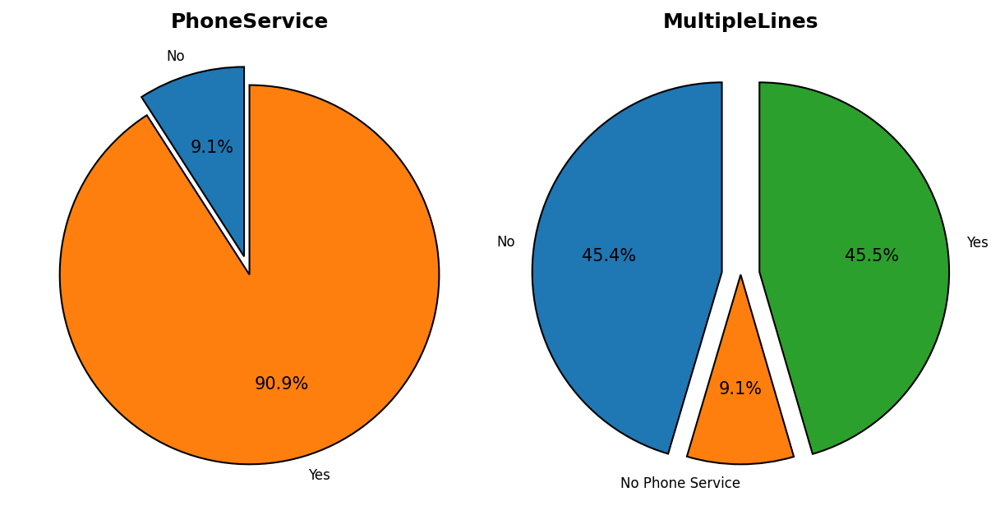

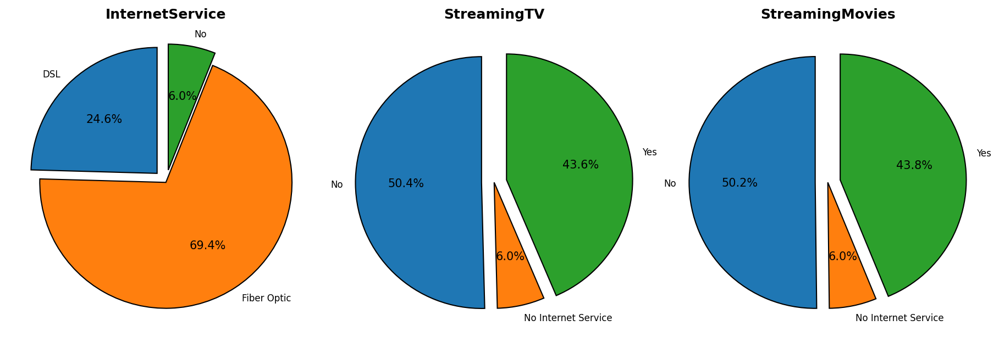

In [ ]:
ax,fig = plt.subplots(nrows = 1,ncols = 2,figsize = (8,8))

plt.subplot(1,2,1)
plt.pie(phoneservice,labels = ['No', 'Yes'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = COLORS,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('PhoneService')

plt.subplot(1,2,2)
plt.pie(multiplelines,labels = ['No','No Phone Service','Yes'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0,0.1),colors = COLORS,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('MultipleLines')

ax,fig = plt.subplots(nrows = 1,ncols = 3,figsize = (12,12))

plt.subplot(1,3,1)
plt.pie(internetservice,labels = ['DSL', 'Fiber Optic','No'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0,0.1),colors = COLORS,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('InternetService')

plt.subplot(1,3,2)
plt.pie(streamingtv,labels = ['No', 'No Internet Service','Yes'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0,0.1),colors = COLORS,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('StreamingTV')

plt.subplot(1,3,3)
plt.pie(streamingmovies,labels = ['No', 'No Internet Service','Yes'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0,0.1),colors = COLORS,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('StreamingMovies')

+ Despite the provision of **PhoneService**, a large proportion of customers have chosen to switch.

+ Similarly, the presence of **MultipleLines** did not seem to make a difference, as customers unsubscribed regardless.

+ There was a clear lack of appreciation for the use of **Fiber Optic cables** for **InternetService**, with a substantial 70% choosing to opt out.

+ In terms of **StreamingTV** & **StreamingMovies**, it is evident that customers without these services were more likely to cancel their subscription. However, it is interesting to note that an average of 43.7% of customers still chose to switch despite having access to streaming content.

#### **Group 2: Services Subscribed**
OnlineSecurity | OnlineBackup | DeviceProtection | TechSupport |

In [ ]:
onlinesecurity = df1[df1['Churn'] == 1]['OnlineSecurity'].value_counts()
onlinesecurity = [onlinesecurity[0] / sum(onlinesecurity) * 100,onlinesecurity[1] / sum(onlinesecurity) * 100, onlinesecurity[2] / sum(onlinesecurity) * 100] # No - No Internet Service - Yes

onlinebackup = df1[df1['Churn'] == 1]['OnlineBackup'].value_counts()
onlinebackup = [onlinebackup[0] / sum(onlinebackup) * 100,onlinebackup[1] / sum(onlinebackup) * 100, onlinebackup[2] / sum(onlinebackup) * 100] # No - No Internet Service - Yes

deviceprotection = df1[df1['Churn'] == 1]['DeviceProtection'].value_counts()
deviceprotection = [deviceprotection[0] / sum(deviceprotection) * 100,deviceprotection[1] / sum(deviceprotection) * 100, deviceprotection[2] / sum(deviceprotection) * 100] # No - No Internet Service - Yes

techsupport = df1[df1['Churn'] == 1]['TechSupport'].value_counts()
techsupport = [techsupport[0] / sum(techsupport) * 100,techsupport[1] / sum(techsupport) * 100, techsupport[2] / sum(techsupport) * 100] # No - No Internet Service - Yes

Text(0.5, 1.0, 'TechSupport')

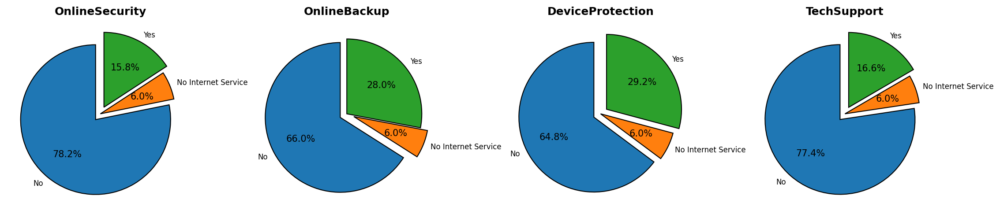

In [ ]:
ax,fig = plt.subplots(nrows = 1,ncols = 4,figsize = (15,15))

plt.subplot(1,4,1)
plt.pie(onlinesecurity,labels = ['No', 'No Internet Service','Yes'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0,0.1),colors = COLORS,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('OnlineSecurity')

plt.subplot(1,4,2)
plt.pie(onlinebackup,labels = ['No', 'No Internet Service','Yes'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0.1,0),colors = COLORS,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('OnlineBackup')

plt.subplot(1,4,3)
plt.pie(deviceprotection,labels = ['No', 'No Internet Service','Yes'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0,0.1),colors = COLORS,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('DeviceProtection')

plt.subplot(1,4,4)
plt.pie(techsupport,labels = ['No', 'No Internet Service','Yes'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0,0.1),colors = COLORS,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('TechSupport')

The pie charts above underscore the importance of offering **OnlineSecurity**, **OnlineBackup**, **DeviceProtection**, and **TechSupport**. It appears that an average of **71.6%** of customers discontinued their services due to the absence of these features.

#### **Group 3: Payment Method**
Contract | PaperlessBilling | PaymentMethod |

In [ ]:
contract = df1[df1['Churn'] == 1]['Contract'].value_counts()
contract = [contract[0] / sum(contract) * 100, contract[1] / sum(contract) * 100, contract[2] / sum(contract) * 100] # Month-to-month - One year - Two year

paperlessbilling = df1[df1['Churn'] == 1]['PaperlessBilling'].value_counts()
paperlessbilling = [paperlessbilling[0] / sum(paperlessbilling) * 100,paperlessbilling[1] / sum(paperlessbilling) * 100] # No - Yes

paymentmethod = df1[df1['Churn'] == 1]['PaymentMethod'].value_counts()
paymentmethod = [paymentmethod[0] / sum(paymentmethod) * 100, paymentmethod[1] / sum(paymentmethod) * 100,
            paymentmethod[2] / sum(paymentmethod) * 100, paymentmethod[3] / sum(paymentmethod) * 100]
            # Bank Transfer (automatic) - Credit Card (automatic) - Electronic check - Mailed check

Text(0.5, 1.0, 'PaymentMethod')

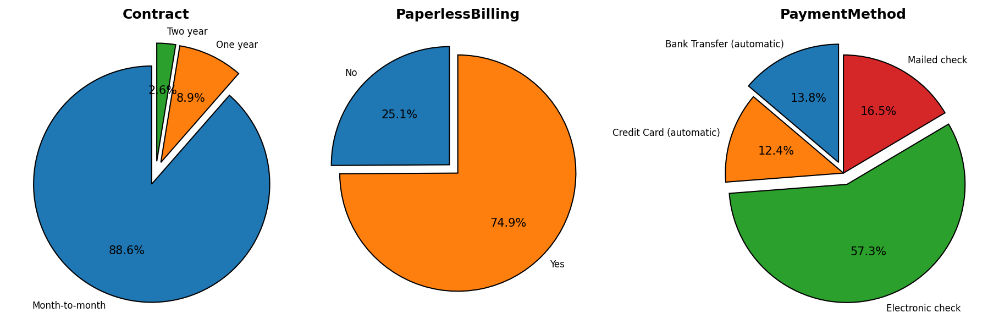

In [ ]:
ax,fig = plt.subplots(nrows = 1,ncols = 3,figsize = (12,12))

plt.subplot(1,3,1)
plt.pie(contract,labels = ['Month-to-month','One year','Two year'],
        autopct='%1.1f%%',startangle = 90,explode = (0.1,0.1,0.1),colors = COLORS,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('Contract')

plt.subplot(1,3,2)
plt.pie(paperlessbilling,labels = ['No', 'Yes'],
        autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = COLORS,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('PaperlessBilling')

plt.subplot(1,3,3)
plt.pie(paymentmethod,labels = ['Bank Transfer (automatic)','Credit Card (automatic)','Electronic check','Mailed check'],
        autopct='%1.1f%%',startangle = 90,explode = (0.1,0,0.1,0),colors = COLORS,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('PaymentMethod')

+ The **Month-to-Month Contract** duration seems to be a significant factor in customer churn, with a whopping 88.6% of customers choosing to switch.

+ **PaperlessBilling** doesn't appear to be well-received by customers.

+ The **Electronic check** payment method is a major concern, accounting for 57.3% of churn. This is followed by Mailed check, Bank Transfer (automatic), and Credit Card (automatic). These issues certainly need to be addressed to improve customer retention.

### **Numerical Features**




#### **Numerical Features Distribution**

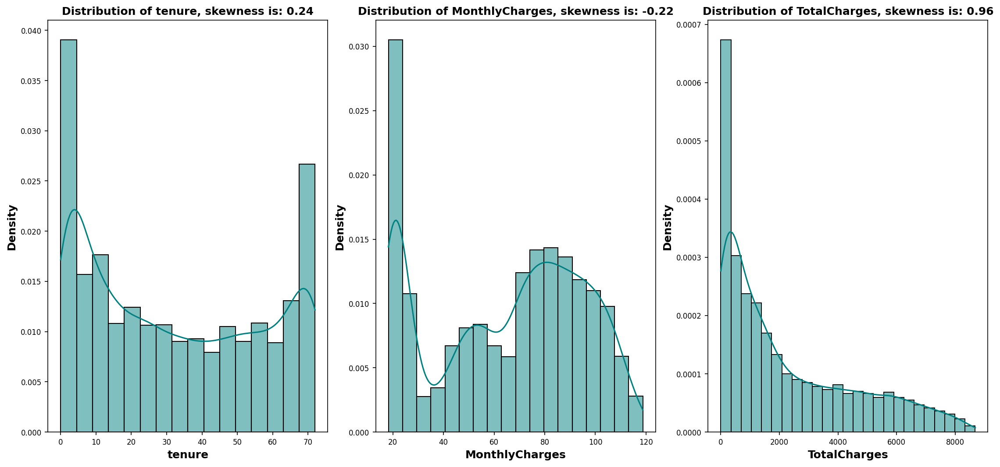

In [ ]:
fig, ax = plt.subplots(nrows = 1,ncols = 3,figsize = (15,7))
for i in range(len(numerical_features)):
    plt.subplot(1, 3, i+1)
    sns.histplot(df1[numerical_features[i]],color = '#008080',
                 stat = 'density', kde = True)
    title = 'Distribution of ' + numerical_features[i] + ', skewness is: ' + str(round(df1[numerical_features[i]].skew(axis = 0, skipna = True),2))
    plt.title(title)
plt.show()

+ **TotalCharges** exhibits a positively or rightly skewed distribution.

+ The distribution of **tenure** and **MonthlyCharges** appears to be bimodal, with peaks observed in the ranges of **0 - 70** and **20 - 80** respectively. This suggests that there are **two distinct** groups of customers in terms of their tenure and monthly charges.

### **Numerical Features with respect to Target Variable**

<ipython-input-43-6b60168b6c29>:7: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(3, 1, i+1)


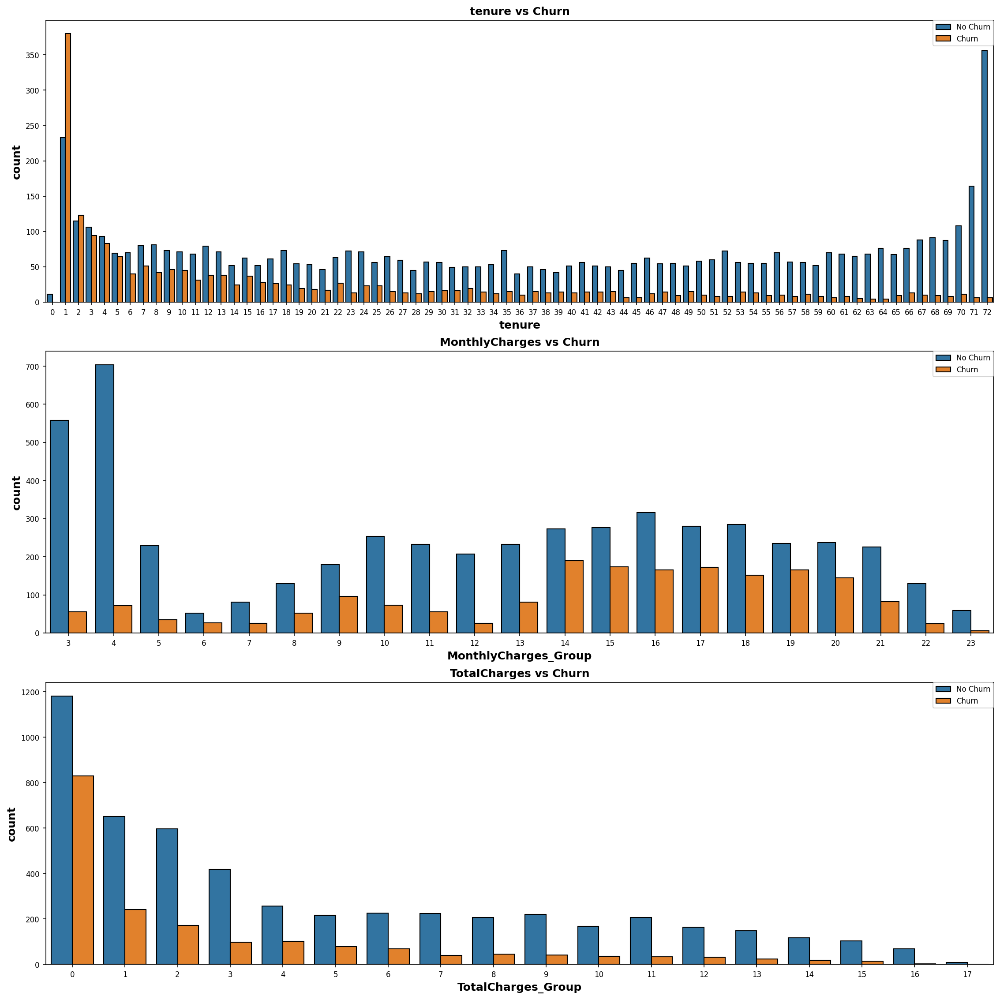

In [ ]:
df1['MonthlyCharges_Group'] = [int(i / 5) for i in df1['MonthlyCharges']]
df1['TotalCharges_Group'] = [int(i / 500) for i in df1['TotalCharges']]

fig, ax = plt.subplots(nrows = 1,ncols = 1,figsize = (15,15))

for i in range(len(numerical_features)):
    plt.subplot(3, 1, i+1)
    if 'tenure' in numerical_features[i]:
      sns.countplot(data = df1, x = numerical_features[i],
                     hue = "Churn",palette = COLORS,edgecolor = 'black')
    else:
      sns.countplot(data = df1, x = numerical_features[i] + '_Group',
                  hue = "Churn",palette = COLORS,edgecolor = 'black')

    plt.legend(['No Churn','Churn'],loc = 'upper right', borderaxespad=0)
    title = numerical_features[i] + ' vs Churn'
    plt.title(title)

+ In terms of **tenure**, there's a noticeable trend of customers discontinuing their services after the first month. This trend of high service cancellation persists for about 4 - 5 months, although the number of customers churning reduces after the first month. As the **tenure** lengthens, the rate of customers opting out decreases.

+ As **tenure** increases, customer churn decreases, resulting in a symmetrical graph where the left side is dominated by high churn numbers and the right side by low churn numbers.

+ In the case of **MonthlyCharges**, there's a high churn rate for charges between **65** (13x5) and **105** (21x5). This range of **MonthlyCharges** seems to be a significant factor in customers' decision to switch services.

+ For TotalCharges, a substantial number of customers discontinued their services when the charges were below **500**. This trend continues for TotalCharges ranging from **0** (0x500) to **1000** (2x500).

### **Extension: Numerical Features vs Categorical Features with respect to Target Variable**

#### **Tenure vs Categorical Features**

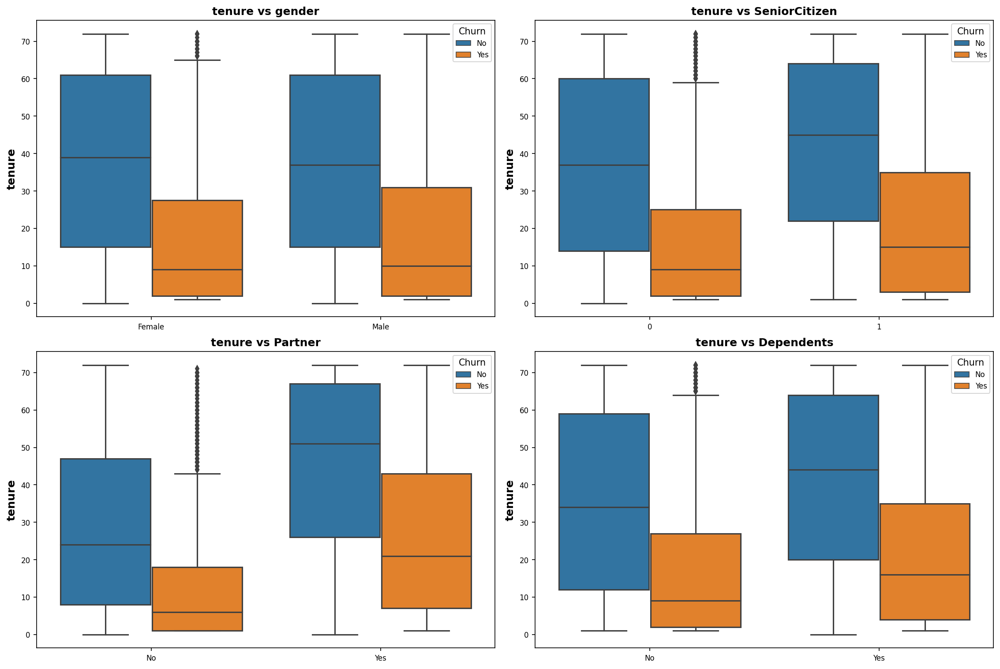

In [ ]:
fig = plt.subplots(nrows = 2,ncols = 2,figsize = (15,10))
for i in range(4):
    plt.subplot(2,2,i+1)
    ax = sns.boxplot(data = opt_df, x = l1[i],y = 'tenure',
                     hue = 'Churn',palette = COLORS);
    plt.title('tenure vs ' + l1[i])
    plt.xlabel("")

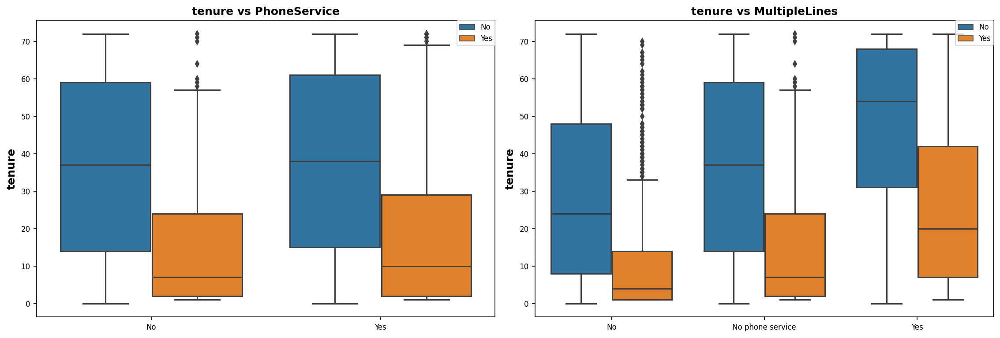

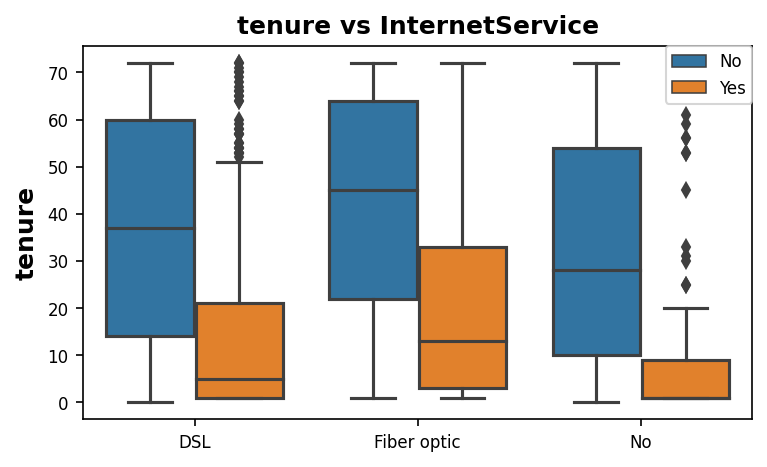

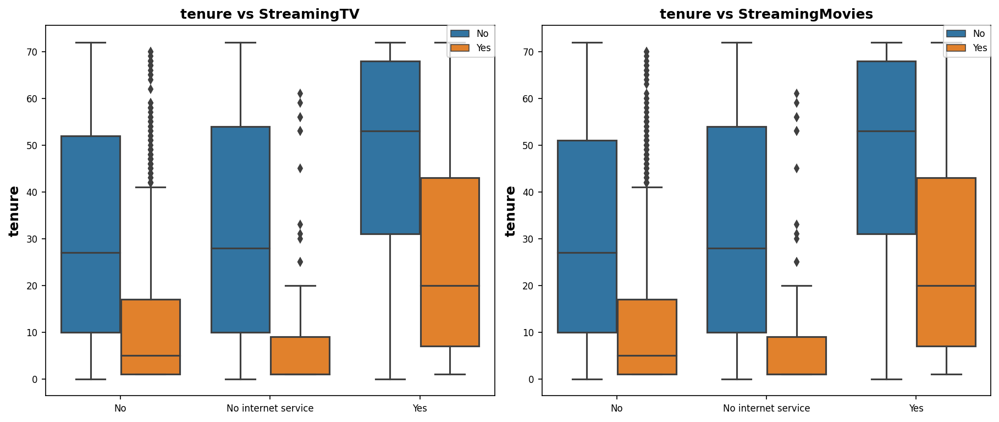

In [ ]:
fig = plt.subplots(nrows = 1,ncols = 2,figsize = (15,5))
for i in range(len(l2[0:2])):
    plt.subplot(1,2,i + 1)
    ax = sns.boxplot(x = l2[i],y = 'tenure',data = opt_df,hue = 'Churn',palette = COLORS);
    plt.title('tenure vs ' + l2[i])
    plt.legend(loc = 'upper right', borderaxespad=0)
    plt.xlabel("")

fig = plt.subplots(nrows = 1, ncols = 1, figsize = (5,3))
plt.subplot(1,1,1)
ax = sns.boxplot(x = l2[2],y = 'tenure',data = opt_df,hue = 'Churn',palette = COLORS);
plt.title('tenure vs ' + l2[2])
plt.legend(loc = 'upper right', borderaxespad=0)
plt.xlabel("")

fig = plt.subplots(nrows = 1,ncols = 2,figsize = (12,5))

for i in range(len(l2[3:5])):
    plt.subplot(1,2,i + 1)
    ax = sns.boxplot(x = l2[i + 3],y = 'tenure',data = opt_df,hue = 'Churn',palette = COLORS);
    plt.title('tenure vs ' + l2[i + 3])
    plt.legend(loc = 'upper right', borderaxespad=0)
    plt.xlabel("")

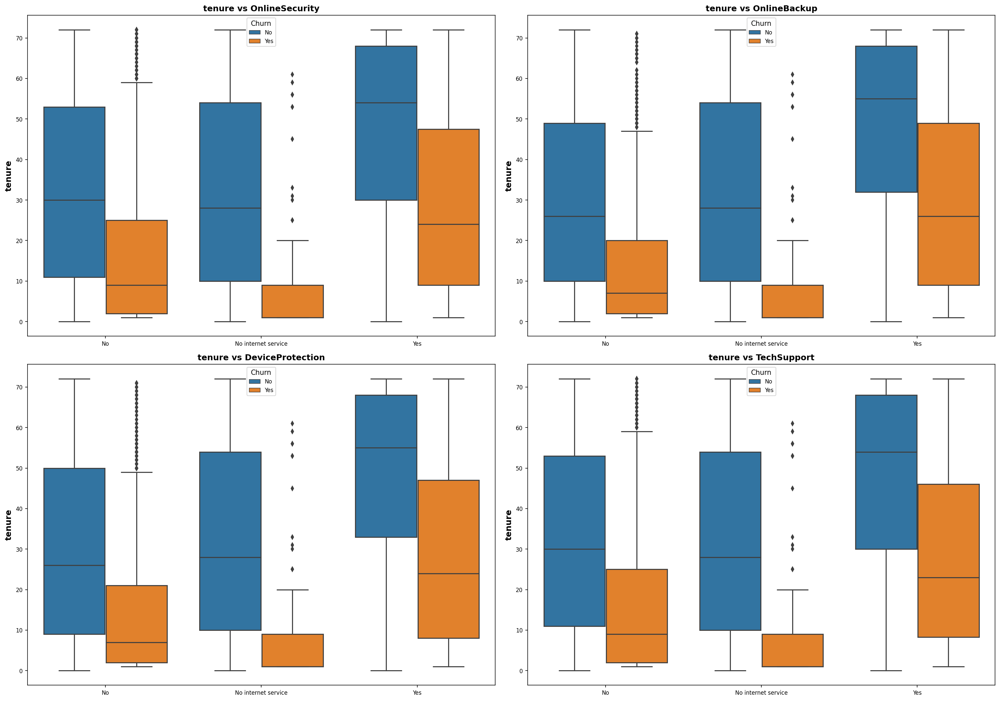

In [ ]:
fig = plt.subplots(nrows = 2,ncols = 2,figsize = (20,14))
for i in range(len(l2[-4:])):
    plt.subplot(2,2,i + 1)
    ax = sns.boxplot(x = l2[i - 4],y = 'tenure',data = opt_df,
                     hue = 'Churn',palette = COLORS)
    plt.title('tenure vs ' + l2[i-4])
    plt.xlabel("")

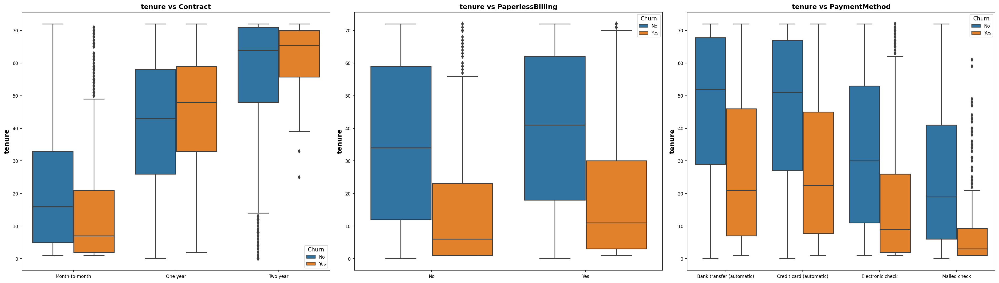

In [ ]:
fig = plt.subplots(nrows = 1,ncols = 3,figsize = (25,7))
for i in range(len(l3)):
    plt.subplot(1,3,i + 1)
    ax = sns.boxplot(x = l3[i],y = 'tenure',data = opt_df,
                     hue = 'Churn',palette = COLORS)
    plt.title('tenure vs ' + l3[i])
    plt.xlabel("")

#### **MonthlyCharges vs Categorical Features**

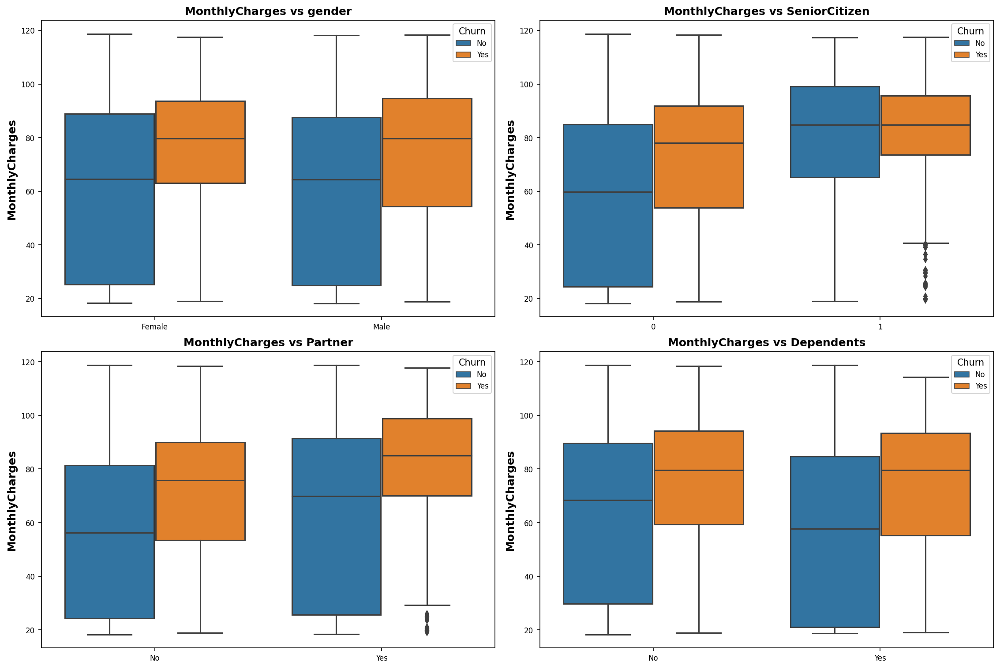

In [ ]:
fig = plt.subplots(nrows = 2,ncols = 2,figsize = (15,10))
for i in range(4):
    plt.subplot(2,2,i+1)
    ax = sns.boxplot(x = l1[i],y = 'MonthlyCharges',
                     data = opt_df,hue = 'Churn',palette = COLORS)
    plt.title('MonthlyCharges vs ' + l1[i])
    plt.xlabel("")

<ipython-input-49-67e175d9bcd9>:19: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


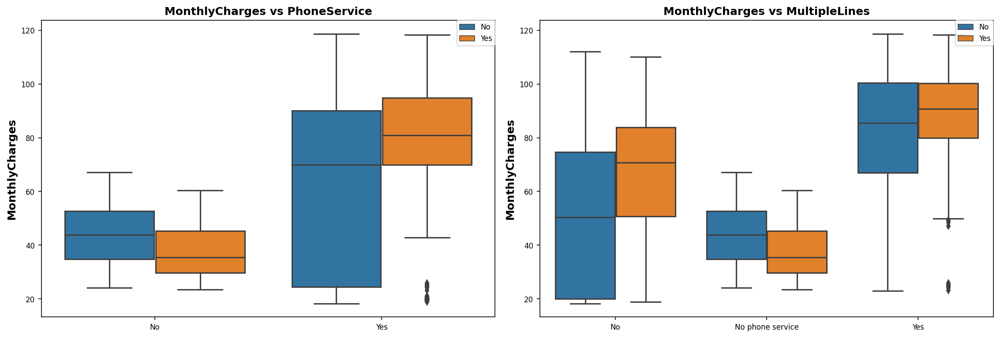

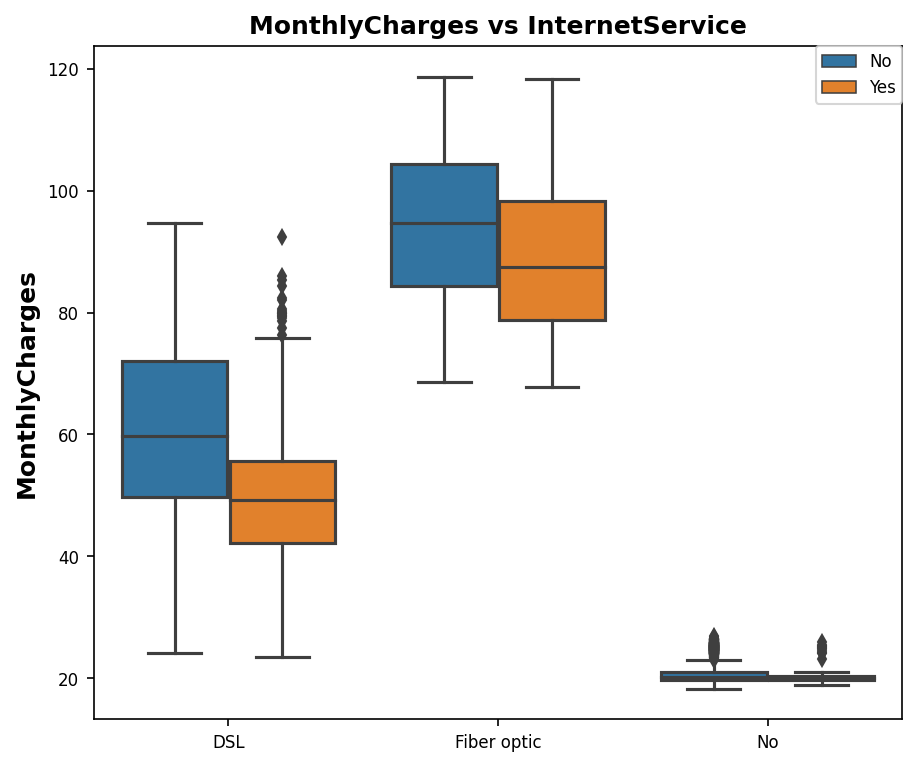

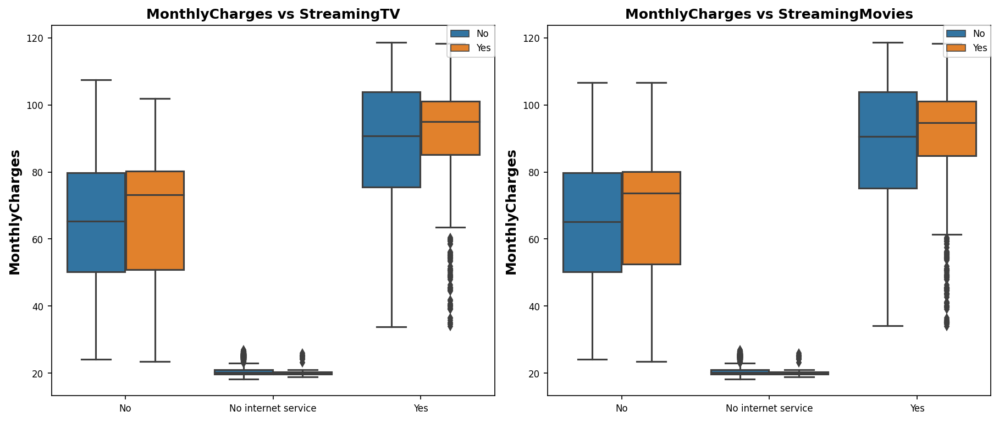

In [ ]:
fig = plt.subplots(nrows = 1,ncols = 2,figsize = (15,5))

for i in range(len(l2[0:2])):
    plt.subplot(1,2,i + 1)
    ax = sns.boxplot(x = l2[i],y = 'MonthlyCharges',
                     data = opt_df,hue = 'Churn',palette = COLORS)
    plt.title('MonthlyCharges vs ' + l2[i])
    plt.xlabel("")
    plt.legend(loc = 'upper right', borderaxespad=0)

fig = plt.subplots(nrows = 1, ncols = 1, figsize = (6,5))

plt.subplot(1,1,1)
ax = sns.boxplot(x = l2[2],y = 'MonthlyCharges',data = opt_df,
                 hue = 'Churn',palette = COLORS)
plt.title('MonthlyCharges vs ' + l2[2])
plt.xlabel("")
plt.legend(loc = 'upper right', borderaxespad=0)
plt.tight_layout()

fig = plt.subplots(nrows = 1,ncols = 2,figsize = (12,5))

for i in range(len(l2[3:5])):
    plt.subplot(1,2,i + 1)
    ax = sns.boxplot(x = l2[i + 3],y = 'MonthlyCharges',
                     data = opt_df,hue = 'Churn',palette = COLORS)
    plt.title('MonthlyCharges vs ' + l2[i + 3])
    plt.xlabel("")
    plt.legend(loc = 'upper right', borderaxespad=0)

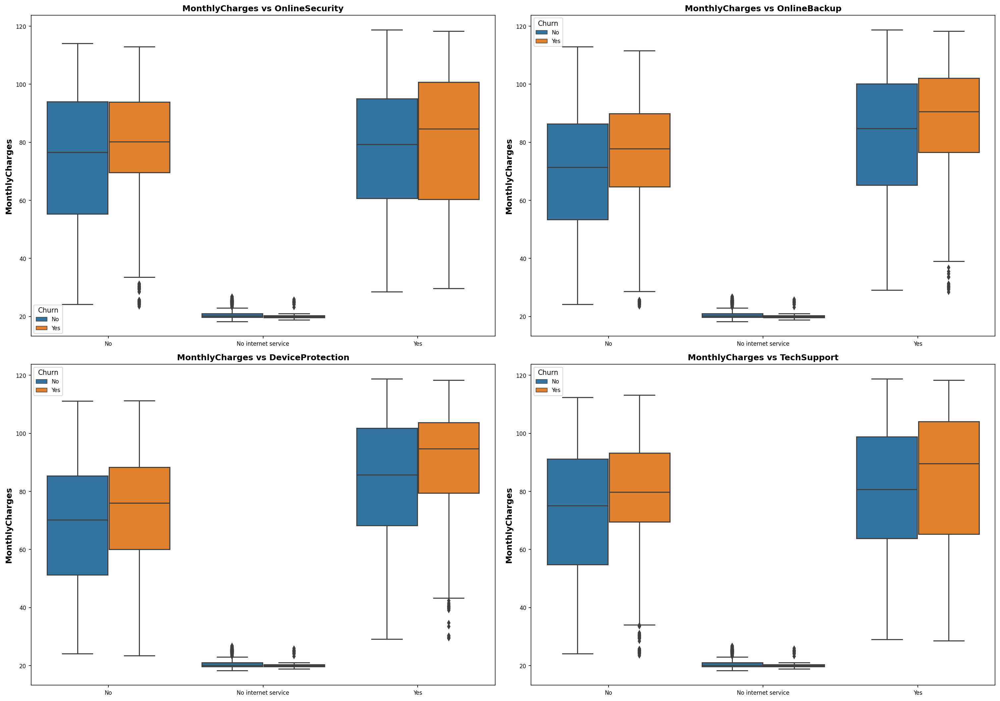

In [ ]:
fig = plt.subplots(nrows = 2,ncols = 2,figsize = (20,14))
for i in range(len(l2[-4:])):
    plt.subplot(2,2,i + 1)
    ax = sns.boxplot(x = l2[i - 4],y = 'MonthlyCharges',
                     data = opt_df,hue = 'Churn',palette = COLORS)
    plt.title('MonthlyCharges vs ' + l2[i-4])
    plt.xlabel("")

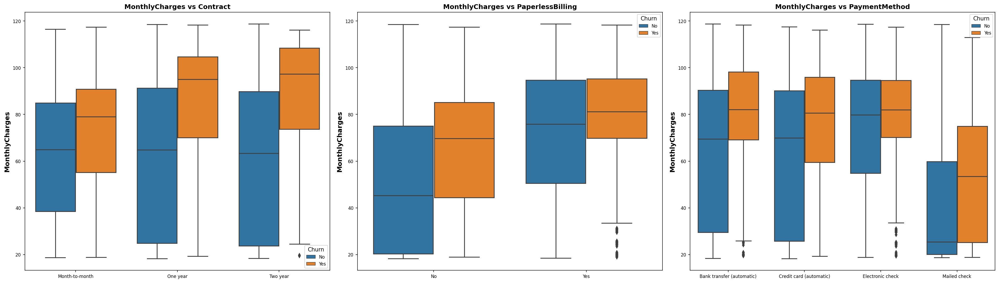

In [ ]:
fig = plt.subplots(nrows = 1,ncols = 3,figsize = (25,7))

for i in range(len(l3)):
    plt.subplot(1,3,i + 1)
    ax = sns.boxplot(x = l3[i],y = 'MonthlyCharges',
                     data = opt_df,hue = 'Churn',palette = COLORS)
    title = 'MonthlyCharges vs ' + l3[i]
    plt.title(title)
    plt.xlabel("")

#### **Total Charges vs Categorical Variables**

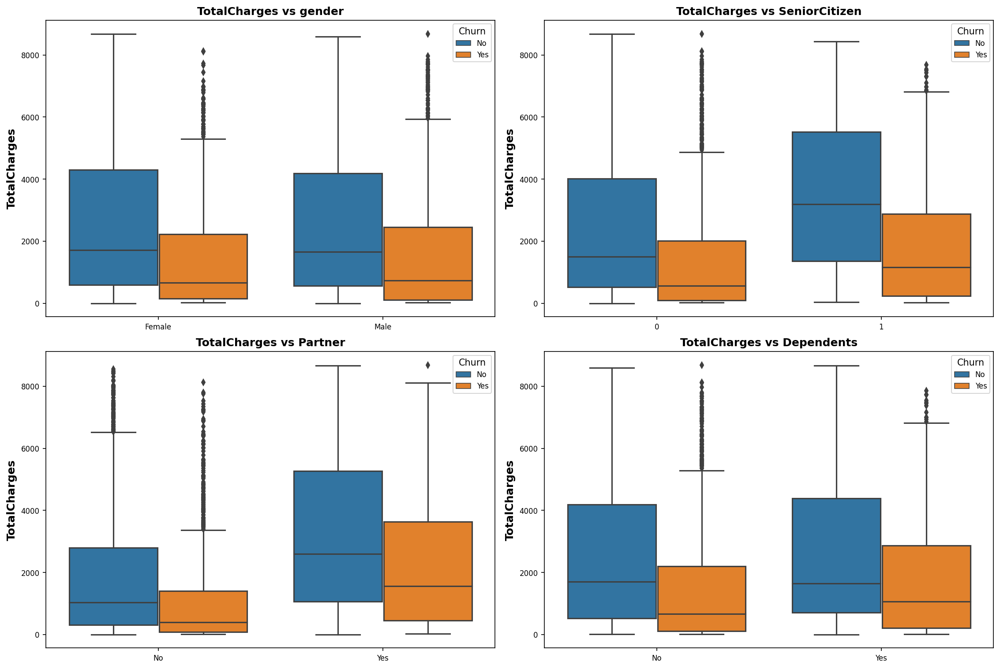

In [ ]:
fig = plt.subplots(nrows = 2,ncols = 2,figsize = (15,10))
for i in range(4):
    plt.subplot(2,2,i+1)
    ax = sns.boxplot(x = l1[i],y = 'TotalCharges',data = opt_df,
                     hue = 'Churn',palette = COLORS);
    plt.title('TotalCharges vs ' + l1[i])
    plt.xlabel("")

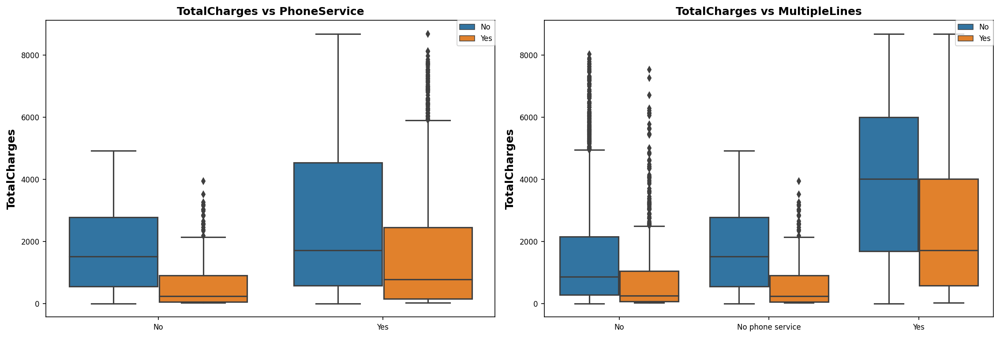

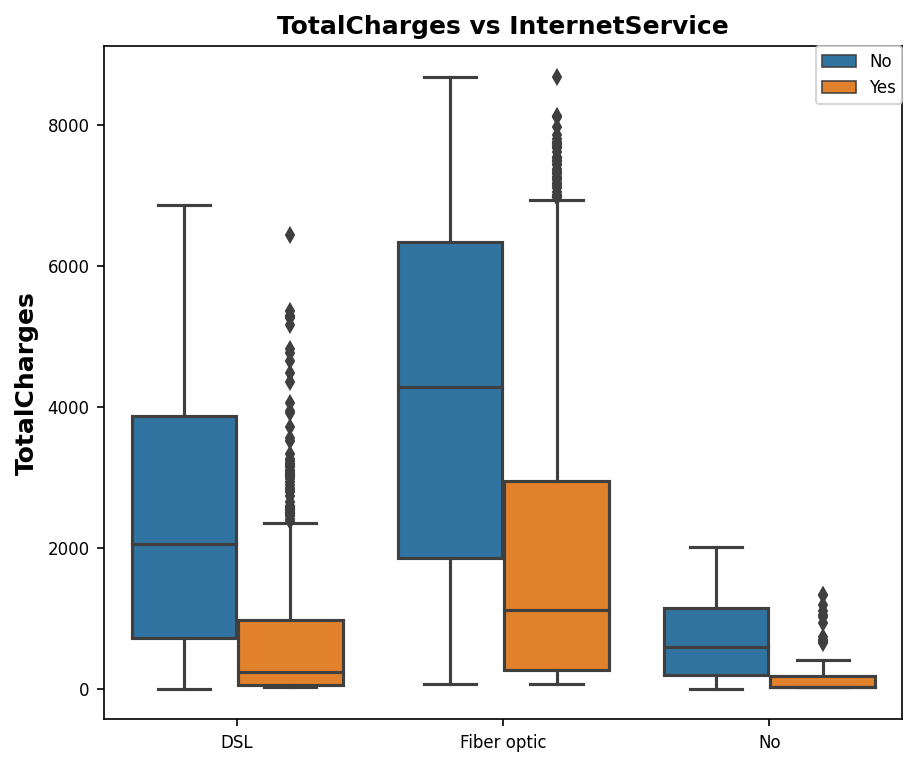

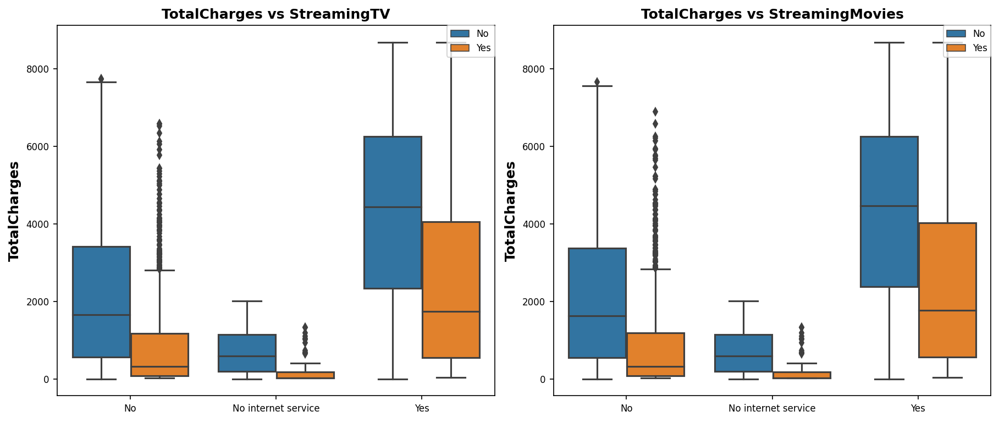

In [ ]:
fig = plt.subplots(nrows = 1,ncols = 2,figsize = (15,5))

for i in range(len(l2[0:2])):
    plt.subplot(1,2,i + 1)
    ax = sns.boxplot(x = l2[i],y = 'TotalCharges',data = opt_df,hue = 'Churn',palette = COLORS)
    plt.title('TotalCharges vs ' + l2[i])
    plt.xlabel("")
    plt.legend(loc = 'upper right', borderaxespad=0)

fig = plt.subplots(nrows = 1, ncols = 1, figsize = (6,5))

plt.subplot(1,1,1)
ax = sns.boxplot(x = l2[2],y = 'TotalCharges',data = opt_df,hue = 'Churn',palette = COLORS)
plt.title('TotalCharges vs ' + l2[2])
plt.xlabel("")
plt.legend(loc = 'upper right', borderaxespad=0)

fig = plt.subplots(nrows = 1,ncols = 2,figsize = (12,5))

for i in range(len(l2[3:5])):
    plt.subplot(1,2,i + 1)
    ax = sns.boxplot(x = l2[i + 3],y = 'TotalCharges',data = opt_df,hue = 'Churn',palette = COLORS)
    plt.title('TotalCharges vs ' + l2[i + 3])
    plt.xlabel("")
    plt.legend(loc = 'upper right', borderaxespad=0)

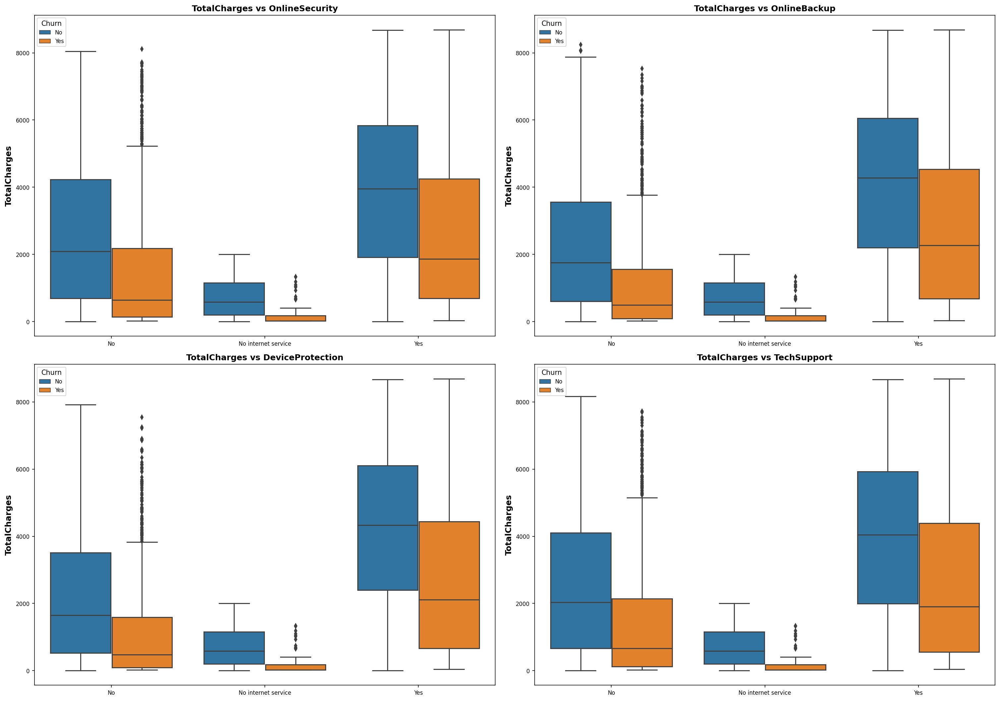

In [ ]:
fig = plt.subplots(nrows = 2,ncols = 2,figsize = (20,14))
for i in range(len(l2[-4:])):
    plt.subplot(2,2,i + 1)
    ax = sns.boxplot(x = l2[i - 4],y = 'TotalCharges',data = opt_df,
                     hue = 'Churn',palette = COLORS)
    plt.title('TotalCharges vs ' + l2[i-4])
    plt.xlabel("")

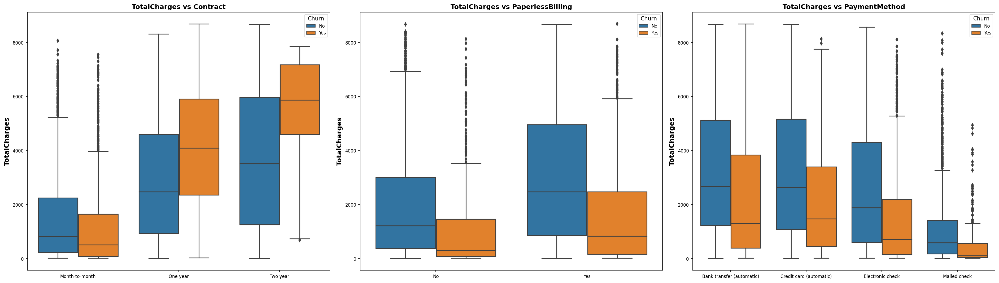

In [ ]:
fig = plt.subplots(nrows = 1,ncols = 3,figsize = (25,7))

for i in range(len(l3)):
    plt.subplot(1,3,i + 1)
    ax = sns.boxplot(x = l3[i],y = 'TotalCharges',
                     data = opt_df,hue = 'Churn',palette = COLORS)
    plt.title('TotalCharges vs ' + l3[i])
    plt.xlabel("")

### **Numerical Features vs Numerical Features with respect to Target Variable**

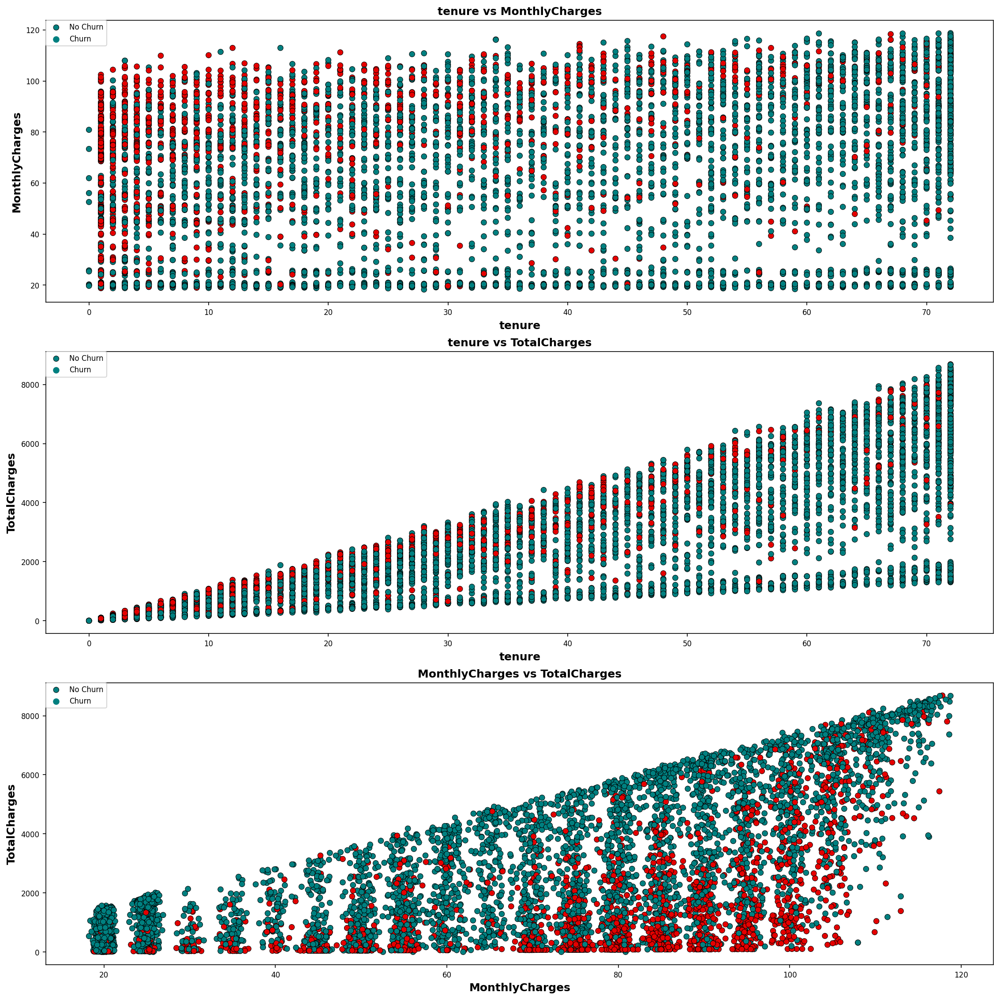

In [ ]:
palette = ['#008080','#E50000']
a = 0
fig,ax = plt.subplots(nrows = 3,ncols = 1,figsize = (15,15))
for i in range(len(numerical_features)):
  for j in range(len(numerical_features)):
    if i != j and j > i:
      a += 1
      plt.subplot(3,1,a)
      sns.scatterplot(x = numerical_features[i], y = numerical_features[j],
                      data = df1, hue = 'Churn', palette = palette,  edgecolor = 'black')
      plt.legend(['No Churn','Churn'], loc = 'upper left', borderaxespad = 0)
      title = numerical_features[i] + ' vs ' + numerical_features[j]
      plt.title(title)

+ During the initial period of **0 - 20** months, customers seem to churn at any MonthlyCharges values. However, for a tenure period from **20 - 60** months, it's primarily the customers at the higher end of the MonthlyCharges spectrum, specifically those with charges between **70 - 120**, who start to discontinue their services.

+ In the relationship between **TotalCharges** and **tenure**, it's observed that as tenure increases, TotalCharges also increase. The customers who chose to discontinue their plans are primarily those who were charged the highest during their tenure period, along with a few customers whose **Total Charges** were in the middle range.

+ It appears that customers decided to cancel their subscriptions when the **MonthlyCharges** reached **70** and above.

## **Feature Engineering**

### **Feature Scaling**

Scaling the data makes training model smoother and more convenient especially for gradient-based models such as Neural Network. Similarly, distanced-based models like KNN or SVM also benefit from scaling data since they are using distances between data points to determine their similarity. However, since we used tree-based algorithms like XGBoost or Random Forest, sensitivity to the scale of features is fairly not a problem as they split a node on a feature that increases the homogeneity of the node or some score function. Hence, there is virtually no effect of the remaining features on the split, which makes them insensitive to different features' units.

In [ ]:
# df1.drop(columns = ['MonthlyCharges_Group','TotalCharges_Group'], inplace = True)
cat_features = df1.copy().loc[:, categorical_features]
num_features = df1.copy().loc[:, numerical_features]
features = df1.copy().loc[:, ~df1.columns.str.contains('Churn')]
target = df1.copy().loc[:, 'Churn']

scaler = MinMaxScaler()
features['tenure'] = scaler.fit_transform(features[['tenure']])
features['MonthlyCharges'] = scaler.fit_transform(features[['MonthlyCharges']])
features['TotalCharges'] = scaler.fit_transform(features[['TotalCharges']])

### **Testing CatBoost Selected Features**

In [ ]:
# from catboost import CatBoostRegressor, Pool, EShapCalcType, EFeaturesSelectionAlgorithm
# x_train, x_test, y_train, y_test = train_test_split(features, target, test_size = 0.20, random_state = 2)
# train_pool = Pool(x_train, y_train, feature_names=categorical_features)
# test_pool = Pool(x_test, y_test, feature_names=categorical_features)
# model = CatBoostRegressor(iterations=1000, random_seed=0)
# summary = model.select_features(
#     train_pool,
#     eval_set=test_pool,
#     features_for_select='0-99',
#     num_features_to_select=6,
#     steps=3,
#     algorithm=EFeaturesSelectionAlgorithm.RecursiveByShapValues,
#     shap_calc_type=EShapCalcType.Regular,
#     train_final_model=True,
#     logging_level='Silent',
#     plot=True
# )

### **Checking Multicollinearity**

In [ ]:
# features = df1.loc[:, categorical_features]
# target = df1.loc[:, 'Churn']
corr = features.corr()
def correlation(df, threshold):
  col_corr = set()  # Set of all the names of correlated columns
  corr_matrix = df.corr()
  for i in range(len(corr_matrix.columns)):
    for j in range(i):
      if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
        colname = corr_matrix.columns[i]  # getting the name of column
        col_corr.add(colname)
  return col_corr

In [ ]:
corr_features = correlation(features, 0.6)
print_info('MultiCollinearity between Features',
      f'Number of correlated features: {len(set(corr_features))}',
      f'Correlated features: {list(corr_features)}')

----------------------------------
MultiCollinearity between Features
----------------------------------
Number of correlated features: 4
Correlated features: ['MonthlyCharges_Group', 'Contract', 'TotalCharges', 'TotalCharges_Group']


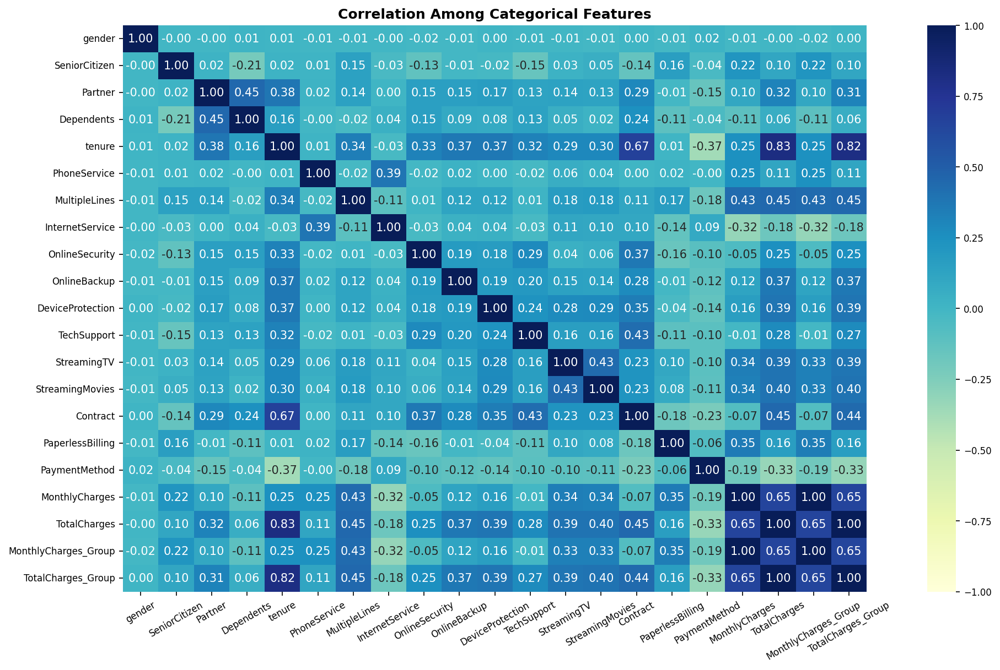

In [ ]:
plt.figure(figsize=(12,8))
sns.heatmap(corr, annot=True, fmt='.2f', cmap="YlGnBu", vmin = -1, vmax = 1)
plt.xticks(rotation=30)
plt.title('Correlation Among Categorical Features')
plt.show()

There are a few strong positive correlation between any feautures. However, since these relationships have been justified for its crucial modeling purpose earlier, it is apparent that we do not have to drop these features depsite their high correlation.

### **Feature Selection**

In [ ]:
%%time
from sklearn.ensemble import RandomForestClassifier
from boruta import BorutaPy

# instantiate random forest
forest = RandomForestClassifier(n_jobs = -1, class_weight='balanced', max_depth = 5)

# fit boruta
boruta_selector = BorutaPy(forest, n_estimators = 'auto', perc = 90, random_state = 0)
boruta_selector.fit(np.array(features), np.array(target))

# store results
boruta_ranking = boruta_selector.ranking_
selected_features = np.array(features.columns)[boruta_ranking <= 1]
removed_features = [feats for feats in categorical_features if feats not in list(selected_features)]

CPU times: user 1min 35s, sys: 1.84 s, total: 1min 37s
Wall time: 1min 9s


In [ ]:
print_info('Features Selection based on Boruta',
           f'Removed features: {removed_features}')

----------------------------------
Features Selection based on Boruta
----------------------------------
Removed features: ['gender', 'SeniorCitizen', 'Partner', 'PhoneService', 'MultipleLines']


#### **Categorical Variables**

Text(0.5, 1.0, 'Selection of Categorical Features')

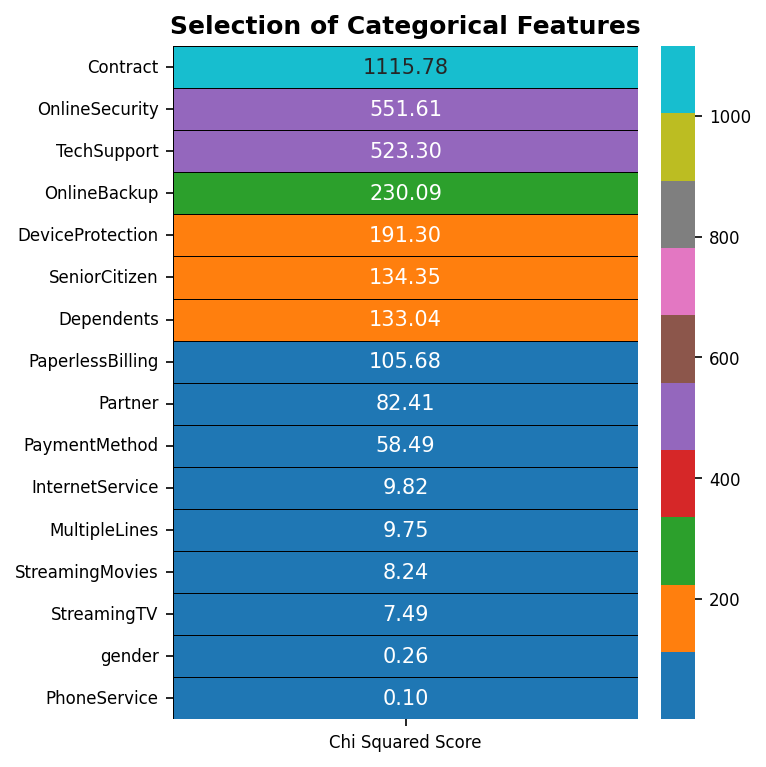

In [ ]:
best_features = SelectKBest(score_func = chi2, k = 'all')
fit = best_features.fit(cat_features, target)

cat_feature_scores = pd.DataFrame(data = fit.scores_,index = list(cat_features.columns), columns = ['Chi Squared Score'])

plt.subplots(figsize = (5,5))
sns.heatmap(cat_feature_scores.sort_values(ascending = False,by = 'Chi Squared Score'),
            annot = True,cmap = COLORS,linewidths = 0.4,linecolor = 'black',fmt = '.2f');
plt.title('Selection of Categorical Features')

**InternetService**, **MultipleLines**, **StreamingMovies**, **StreamingTV**, **gender**, **PhoneService** show a significantly low relation with **Churn**

#### **Numerical Features**

Text(0.5, 1.0, 'Selection of Numerical Features')

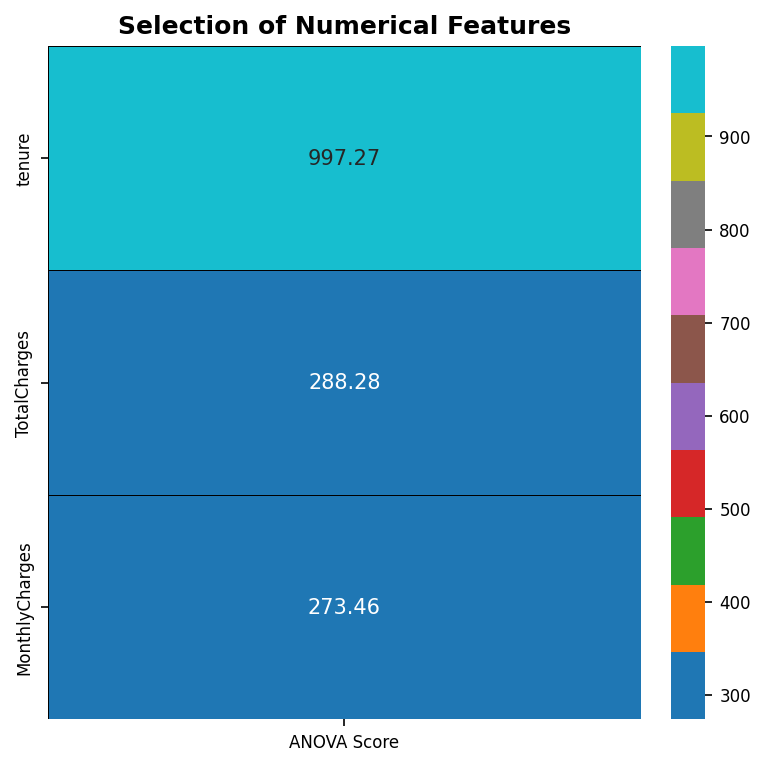

In [ ]:
best_features = SelectKBest(score_func = f_classif, k = 'all')
fit = best_features.fit(num_features, target)

num_feature_scores = pd.DataFrame(data = fit.scores_,index = list(num_features.columns),columns = ['ANOVA Score'])

plt.subplots(figsize = (5,5))
sns.heatmap(num_feature_scores.sort_values(ascending = False,by = 'ANOVA Score'),annot = True,
            cmap = COLORS,linewidths = 0.4,linecolor = 'black',fmt = '.2f');
plt.title('Selection of Numerical Features')

From the above results, we need to include all the numerical features for modeling

**Summary:**

**Remove Features (Chi-square Test):** PhoneService, gender, StreamingTV, StreamingMovies, MultipleLines and InternetService

**Remove Features (Boruta):** PhoneService, gender, Partner, MultipleLines, SeniorCitizen.

Hence, we will take the common features in these two methods to complete the set of removed features.

In [ ]:
df1.drop(columns = ['PhoneService', 'gender','StreamingTV','StreamingMovies','MultipleLines','InternetService'],inplace = True)

df2 = df1.copy().drop(columns = ['Partner'])

# **Data Modeling**

## **Train Test Split**

In [ ]:
features = df1.copy().iloc[:, :13].values
target = df1.copy().iloc[:, 13].values

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(features, target, stratify = target, test_size = 0.20, random_state = 2)

## **Feature Scaling**

In [ ]:
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [ ]:
df1.iloc[:, 13].values

array([0, 0, 1, ..., 0, 1, 0])

## **Functions for Modeling**

In [ ]:
from sklearn.metrics import RocCurveDisplay, PrecisionRecallDisplay, recall_score, accuracy_score, precision_score, f1_score, roc_auc_score, matthews_corrcoef, roc_curve, auc
def calculate_tpr_fpr(y_real, y_pred):
    '''
    Calculates the True Positive Rate (tpr) and the True Negative Rate (fpr) based on real and predicted observations

    Args:
        y_real: The list or series with the real classes
        y_pred: The list or series with the predicted classes

    Returns:
        tpr: The True Positive Rate of the classifier
        fpr: The False Positive Rate of the classifier
    '''

    # Calculates the confusion matrix and recover each element
    cm = confusion_matrix(y_real, y_pred)
    TN = cm[0, 0]
    FP = cm[0, 1]
    FN = cm[1, 0]
    TP = cm[1, 1]

    # Calculates tpr and fpr
    tpr =  TP/(TP + FN) # sensitivity - true positive rate
    fpr = 1 - TN/(TN+FP) # 1-specificity - false positive rate

def get_all_roc_coordinates(y_real, y_proba):
    '''
    Calculates all the ROC Curve coordinates (tpr and fpr) by considering each point as a threshold for the predicion of the class.

    Args:
        y_real: The list or series with the real classes.
        y_proba: The array with the probabilities for each class

    Returns:
        tpr_list: The list of TPRs representing each threshold.
        fpr_list: The list of FPRs representing each threshold.
    '''
    tpr_list = [0]
    fpr_list = [0]
    for i in range(len(y_proba)):
        threshold = y_proba[i]
        y_pred = y_proba >= threshold
        tpr, fpr = calculate_tpr_fpr(y_real, y_pred)
        tpr_list.append(tpr)
        fpr_list.append(fpr)
    return tpr_list, fpr_list

def plot_roc_curve(tpr, fpr, scatter = False, ax = None, **kwargs):
  '''
  Plots the ROC Curve by using coordinates (tpr and fpr).

  Parameters:
      tpr: TPR representing each coordinate.
      fpr: FPR representing each coordinate.
      scatter: When True, the points used on the calculation will be plotted with the line (default = True).
  '''
  if ax == None:
    plt.figure(figsize = (5, 5))
    ax = plt.axes()

  if scatter:
    sns.scatterplot(x = fpr, y = tpr, ax = ax)
  else:
    sns.lineplot(x = fpr, y = tpr, ax = ax, **kwargs)

  sns.lineplot(x = [0, 1], y = [0, 1], color = 'green', ax = ax,
               linestyle = '--', label= "ROC curve for chance level (AUC = 0.5)")
  plt.xlim(-0.05, 1.05)
  plt.ylim(-0.05, 1.05)
  plt.xlabel("False Positive Rate")
  plt.ylabel("True Positive Rate")

def plot_pr_curve(ax = None, **kwargs):
  '''
  Plots the ROC Curve by using coordinates (tpr and fpr).

  Parameters:
      tpr: TPR representing each coordinate.
      fpr: FPR representing each coordinate.
      scatter: When True, the points used on the calculation will be plotted with the line (default = True).
  '''
  if ax == None:
    plt.figure(figsize = (5, 5))
    ax = plt.axes()

  sns.lineplot(x = [1, 1], y = [1, 0], c = 'k', ax = ax,
               linestyle = 'dashdot')
  sns.lineplot([1, 1], c='k', linestyle='dashdot', zorder=2, ax = ax,
               label= "Perfect PR curve")
  sns.lineplot(x = [0, 1], y = [1, 0], color = 'green', ax = ax,
               linestyle = '--', label= "PR curve for chance level")
  plt.xlim(-0.05, 1.05)
  plt.ylim(-0.05, 1.05)
  plt.xlabel("Recall")
  plt.ylabel("Precision")


def model(classifier,x_train,y_train,x_test,y_test, cross_validation = True, plot = True):
    model_name = type(classifier).__name__
    if model_name in ['XGBClassifier', 'CatBoostClassifier']:
      classifier.fit(x_train, y_train, verbose = False)
    else:
      classifier.fit(x_train, y_train)
    y_pred = classifier.predict(x_test)
    y_prob = classifier.predict_proba(x_test)[:, 1]
    if cross_validation:
      cv = RepeatedStratifiedKFold(n_splits = 10, n_repeats = 3,random_state = 1)
      print("Cross Validation Score (Recall) : ", '{0:.2%}'.format(cross_val_score(classifier,x_train,y_train,cv = cv, scoring = 'recall').mean()))
      print("Cross Validation Score (Precision) : ", '{0:.2%}'.format(cross_val_score(classifier,x_train,y_train,cv = cv, scoring = 'precision').mean()))

    print("ROC_AUC Score : ",'{0:.2%}'.format(roc_auc_score(y_test, y_pred)))
    print("Recall Score : ",'{0:.2%}'.format(recall_score(y_test, y_pred)))
    precision = precision_score(y_test, y_pred)
    if plot:

      fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 5))
      fpr, tpr, _ = roc_curve(y_test, y_prob, pos_label = 1)
      plot_roc_curve(tpr, fpr, ax = ax1, label = f" {model_name} (AUC = {auc(fpr, tpr):.2f})")
      # RocCurveDisplay.from_estimator(classifier, x_test, y_test, ax = ax1)
      ax1.legend(loc = 'lower right')
      ax1.set_title('ROC Curve')

      PrecisionRecallDisplay.from_estimator(classifier, x_test, y_test, ax = ax2)
      plot_pr_curve(ax = ax2, label = f" {model_name} (Average Precision = {precision:.2f})")
      ax2.legend(loc = 'lower left')
      ax2.set_title('PR Curve')

      plt.show()

def model_evaluation(classifier,x_test,y_test):

    # Confusion Matrix
    cm = confusion_matrix(y_test, classifier.predict(x_test))
    names = ['True Neg','False Pos','False Neg','True Pos']
    counts = [value for value in cm.flatten()]
    percentages = ['{0:.2%}'.format(value) for value in cm.flatten()/np.sum(cm)]
    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(names,counts,percentages)]
    labels = np.asarray(labels).reshape(2,2)
    names =[ "non-churn", "churn"]
    sns.heatmap(cm,annot = labels, cmap = 'Blues',fmt ='',
                xticklabels = names, yticklabels = names)
    plt.xlabel('Predicted label')
    plt.ylabel('Truth label')

    # Classification Report
    print(classification_report(y_test,classifier.predict(x_test)))

def model_label_metrics_report(classifier, X, y):
  """
  Function to compute the some assessment metrics based on class labels
  solely. These includes accuracy, precision, recall, f1-score, matthews, and
  AUC score
  """
  y_pred = classifier.predict(X)

  acc = accuracy_score(y, y_pred)  # compute Accuracy
  recall = recall_score(y, y_pred)  # compute Recall
  precision = precision_score(y, y_pred)  # compute Precision
  f1 = f1_score(y, y_pred)  # compute F1-score
  mcc = matthews_corrcoef(y, y_pred) # matthews
  auc = roc_auc_score(y, y_pred) # compute auc

  # creating a dataframe of metrics
  df_perf = pd.DataFrame(
      {"Accuracy": acc, "Recall": recall, "Precision": precision,
       "F1": f1, "Matthews Coef": mcc, "ROC_AUC": auc},
      index=[0])
  return df_perf

## **Random Forest**

### **Baseline**

In [ ]:
# rf_params = {'max_depth': 14, 'min_samples_leaf': 2, 'min_samples_split': 3, 'n_estimators': 130}
classifier_rf = RandomForestClassifier(max_depth = 4, random_state = 13)

In [ ]:
classifier_rf.fit(x_train, y_train)

RandomForestClassifier(max_depth=4, random_state=13)

In [ ]:
prob = classifier_rf.predict_proba(x_test)

Cross Validation Score (Recall) :  41.18%
Cross Validation Score (Precision) :  68.19%
ROC_AUC Score :  68.04%
Recall Score :  41.98%


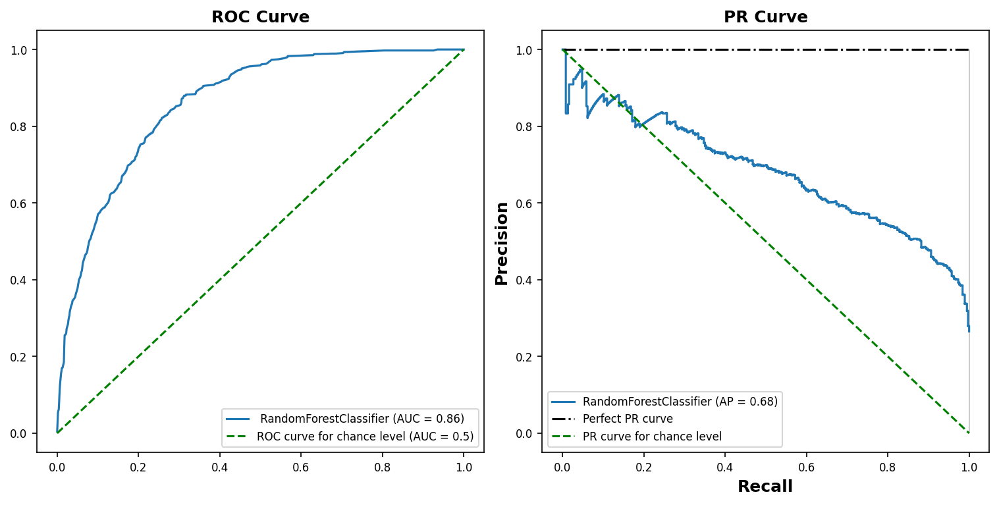

In [ ]:
model(classifier_rf, x_train, y_train, x_test, y_test)

              precision    recall  f1-score   support

           0       0.82      0.94      0.88      1035
           1       0.72      0.42      0.53       374

    accuracy                           0.80      1409
   macro avg       0.77      0.68      0.70      1409
weighted avg       0.79      0.80      0.78      1409



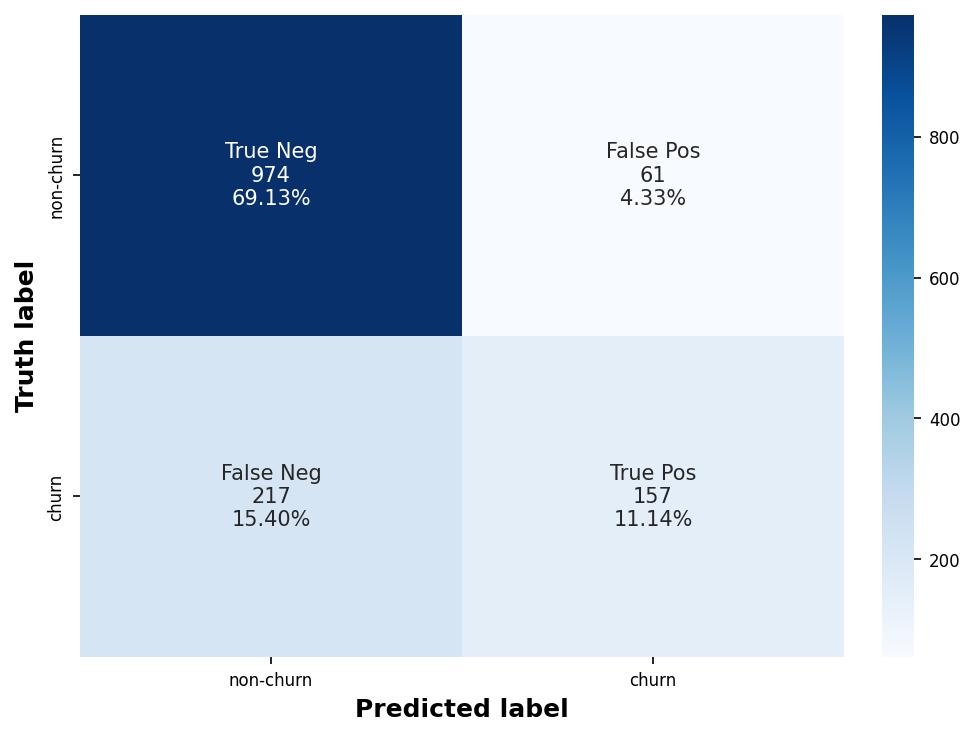

In [ ]:
 model_evaluation(classifier_rf, x_test, y_test)

In [ ]:
rf_perf = model_label_metrics_report(classifier_rf, x_test, y_test)
rf_perf

,Accuracy,Recall,Precision,F1,Matthews Coef,ROC_AUC
0,0.802697,0.419786,0.720183,0.530405,0.440603,0.680424


### **Fine-tuned**

In [ ]:
# # Define the objective function to be optimized
# def objective(trial):
#     param_grid  = {
#         'n_estimators' : trial.suggest_int('n_estimators', 50, 1000),
#         'min_samples_split': trial.suggest_int('min_samples_split', 2, 200),
#         'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 60),
#         'max_depth': trial.suggest_int('max_depth', 4, 50),
#         'max_features' : trial.suggest_categorical('max_features', ['log2', 'sqrt']),
#         'class_weight': trial.suggest_categorical('class_weight', ['balanced', 'balanced_subsample']),
#         'criterion': trial.suggest_categorical('criterion', ['gini', 'entropy', 'log_loss'])
#     }

#     model = RandomForestClassifier(**param_grid, n_jobs=-1)

#     # Assuming X_train and y_train are your data
#     score = cross_val_score(model, x_train, y_train,
#                             cv=StratifiedKFold(n_splits=5), scoring = 'recall', n_jobs = -1)
#     return score.mean()

# # Create a study object
# study = optuna.create_study(direction='maximize')

# # Optimize the study
# study.optimize(objective, n_trials=20)


# print_info('Hyperparameter Tuning for Random Forest',
#            f'Best trial: {study.best_trial}',
#            f'Best value: {study.best_value}')

In [ ]:
# params = study.best_trial.params
params_rf = {'n_estimators': 215, 'min_samples_split': 23, 'min_samples_leaf': 53,
             'max_depth': 48, 'max_features': 'log2',
             'class_weight': 'balanced_subsample', 'criterion': 'gini'}
classifier_rf_tuned = RandomForestClassifier(**params_rf, random_state=42)
# model(classifier_rf_tuned, x_train, y_train, x_test, y_test)
# model_evaluation(classifier_rf_tuned,x_test,y_test)
# model_label_metrics_report(classifier_rf_tuned, x_test, y_test)

Cross Validation Score (Recall) :  79.73%
Cross Validation Score (Precision) :  51.12%
ROC_AUC Score :  79.21%
Recall Score :  84.22%


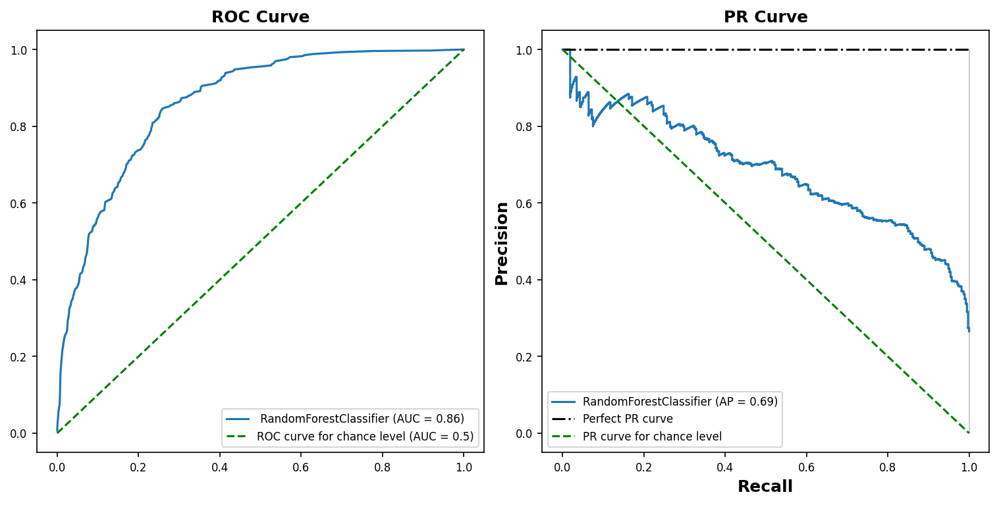

In [ ]:
model(classifier_rf_tuned, x_train, y_train, x_test, y_test, cross_validation = False)

              precision    recall  f1-score   support

           0       0.93      0.74      0.82      1035
           1       0.54      0.84      0.66       374

    accuracy                           0.77      1409
   macro avg       0.73      0.79      0.74      1409
weighted avg       0.83      0.77      0.78      1409



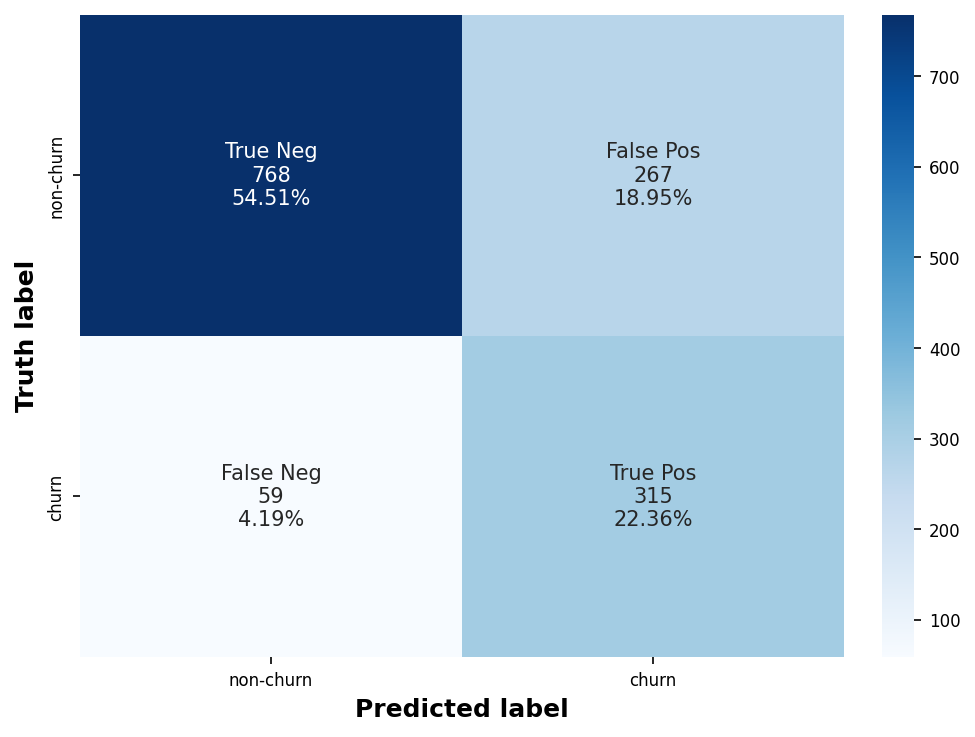

In [ ]:
model_evaluation(classifier_rf_tuned,x_test,y_test)

In [ ]:
rf_tuned_perf = model_label_metrics_report(classifier_rf_tuned, x_test, y_test)
rf_tuned_perf

,Accuracy,Recall,Precision,F1,Matthews Coef,ROC_AUC
0,0.76863,0.842246,0.541237,0.658996,0.523973,0.792137


## **XGBoost**

In [ ]:
from xgboost import XGBClassifier

### **Baseline**

In [ ]:
classifier_xgb = XGBClassifier('objective': 'binary:logistic', random_state=42)

Cross Validation Score (Recall) :  50.30%
Cross Validation Score (Precision) :  60.49%
ROC_AUC Score :  69.16%
Recall Score :  48.66%


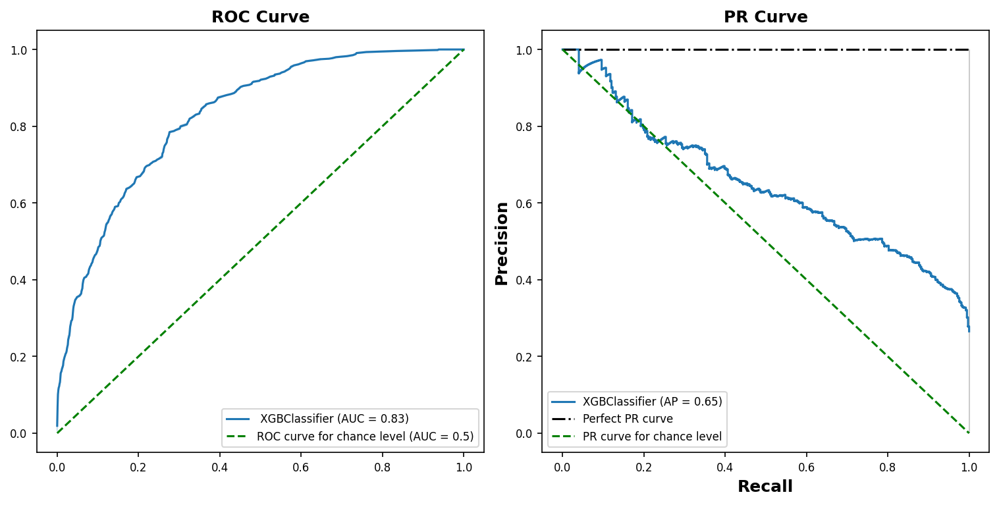

In [ ]:
model(classifier_xgb, x_train, y_train, x_test, y_test)

              precision    recall  f1-score   support

           0       0.83      0.90      0.86      1035
           1       0.63      0.49      0.55       374

    accuracy                           0.79      1409
   macro avg       0.73      0.69      0.71      1409
weighted avg       0.78      0.79      0.78      1409



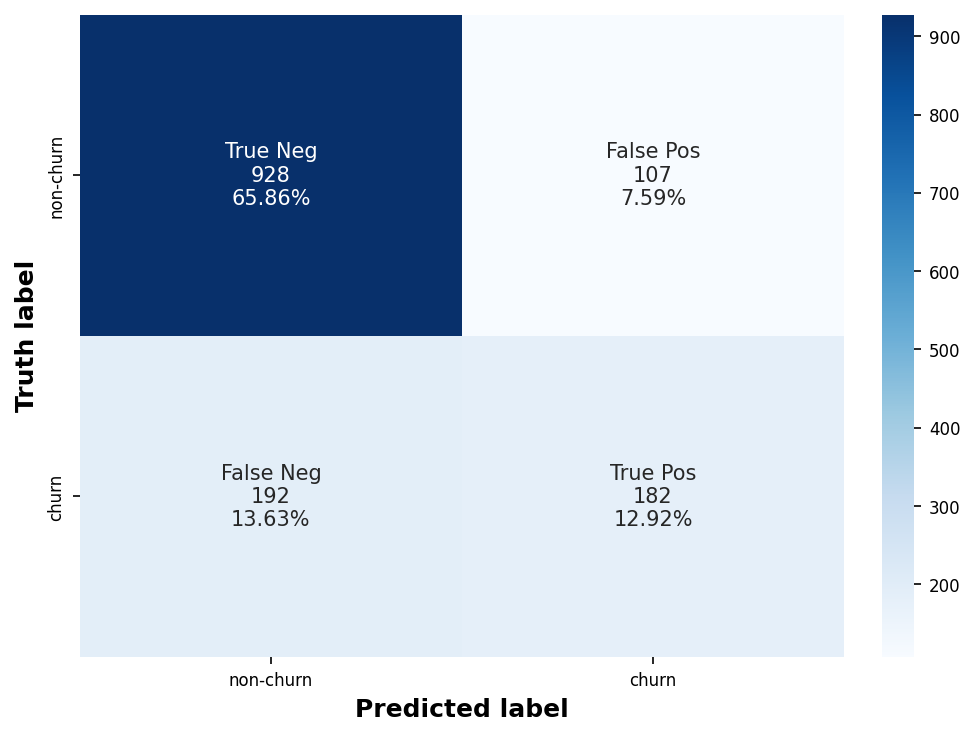

In [ ]:
model_evaluation(classifier_xgb, x_test,y_test)

In [ ]:
xgb_perf = model_label_metrics_report(classifier_xgb, x_test, y_test)
xgb_perf

,Accuracy,Recall,Precision,F1,Matthews Coef,ROC_AUC
0,0.787793,0.486631,0.629758,0.54902,0.419111,0.691625


### **Fine-tuned**

In [ ]:
# def objective(trial):
#     params = {
#         'booster': trial.suggest_categorical('booster', ['gbtree', 'dart']),
#         'max_depth': trial.suggest_int('max_depth', 2, 22),
#         'reg_alpha': trial.suggest_int('reg_alpha', 1, 50),
#         'reg_lambda': trial.suggest_uniform('reg_lambda', 0, 1),
#         'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1),
#         'n_estimators': trial.suggest_int('n_estimators', 1000, 3500),
#         'scale_pos_weight': trial.suggest_int('scale_pos_weight', 1, 5),
#         'learning_rate': trial.suggest_uniform('learning_rate', 0.01, 0.1),
#         'colsample_bylevel': trial.suggest_uniform('colsample_bylevel', 0.6, 1),
#         'tree_method' : 'gpu_hist'
#     }

#     # Setting `device` and `tree_method` parameter to fit GPU
#     model = XGBClassifier(**params, random_state = 42)

#     # Assuming X_train and y_train are your data
#     # score = cross_val_score(model, x_train, y_train, cv= StratifiedKFold(n_splits = 5),
#     #                         scoring='recall', n_jobs = -1)
#     model.fit(x_train, y_train, verbose=False)#cat_features = cat_features, )
#     y_pred = model.predict(x_test)
#     return recall_score(y_test, y_pred)

# study = optuna.create_study(direction='maximize')
# study.optimize(objective, n_trials=20)

# print_info('Hyperparameter Tuning for XGBoost',
#            f'Best trial: {study.best_trial}',
#            f'Best value: {study.best_value}')

In [ ]:
# params = study.best_trial.params
params_xgb = {'booster': 'dart', 'max_depth': 14, 'reg_alpha': 42,
              'reg_lambda': 0.35212486883229993, 'colsample_bytree': 0.7524548238149426,
              'n_estimators': 1000, 'scale_pos_weight': 5, 'learning_rate': 0.08455056117319262,
              'colsample_bylevel': 0.6035313857829073, 'tree_method' : 'gpu_hist', 'objective': 'binary:logistic'}
classifier_xgb_tuned = XGBClassifier(**params_xgb, verbosity = 0, random_state=42)

ROC_AUC Score :  76.49%
Recall Score :  92.78%


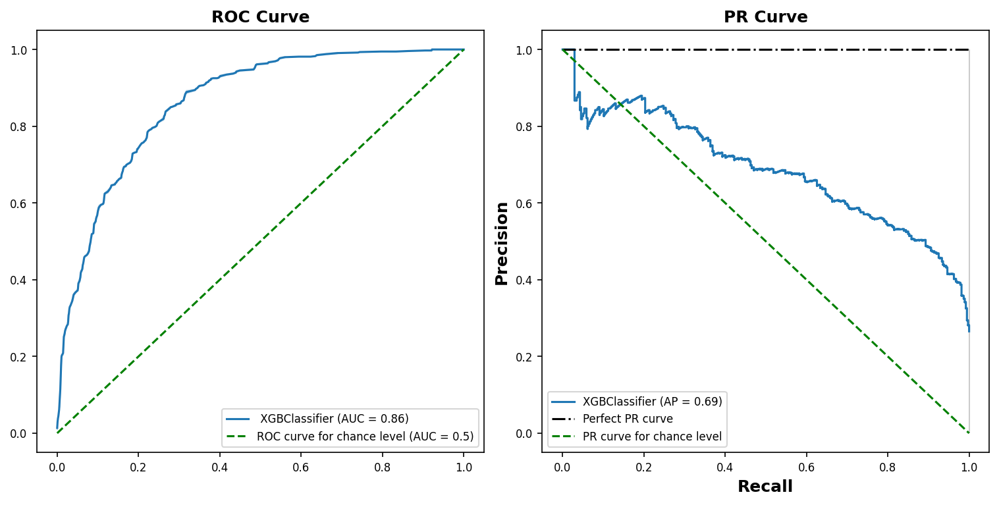

In [ ]:
model(classifier_xgb_tuned, x_train, y_train, x_test, y_test, cross_validation = False)

              precision    recall  f1-score   support

           0       0.96      0.60      0.74      1035
           1       0.46      0.93      0.61       374

    accuracy                           0.69      1409
   macro avg       0.71      0.76      0.68      1409
weighted avg       0.83      0.69      0.71      1409



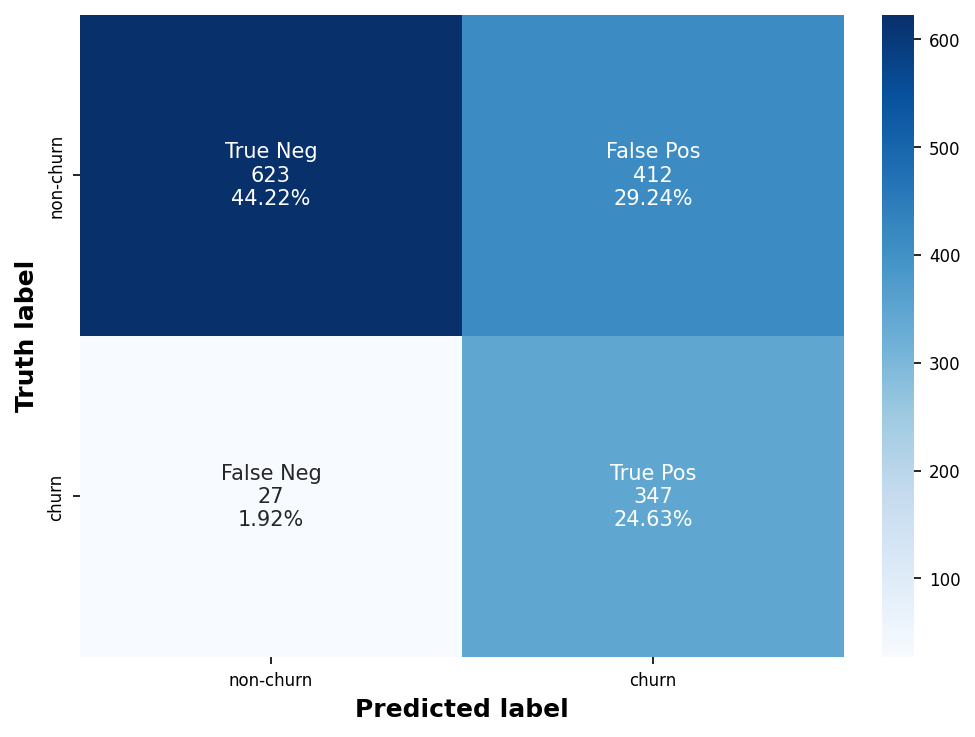

In [ ]:
model_evaluation(classifier_xgb_tuned,x_test,y_test)

In [ ]:
xgb_tuned_perf = model_label_metrics_report(classifier_xgb_tuned, x_test, y_test)
xgb_tuned_perf

,Accuracy,Recall,Precision,F1,Matthews Coef,ROC_AUC
0,0.688,0.928,0.457,0.613,0.469,0.765


## **CatBoost**

In [ ]:
from catboost import CatBoostClassifier

### **Baseline**

Cross Validation Score (Recall) :  50.52%
Cross Validation Score (Precision) :  66.22%
ROC_AUC Score :  70.59%
Recall Score :  50.27%


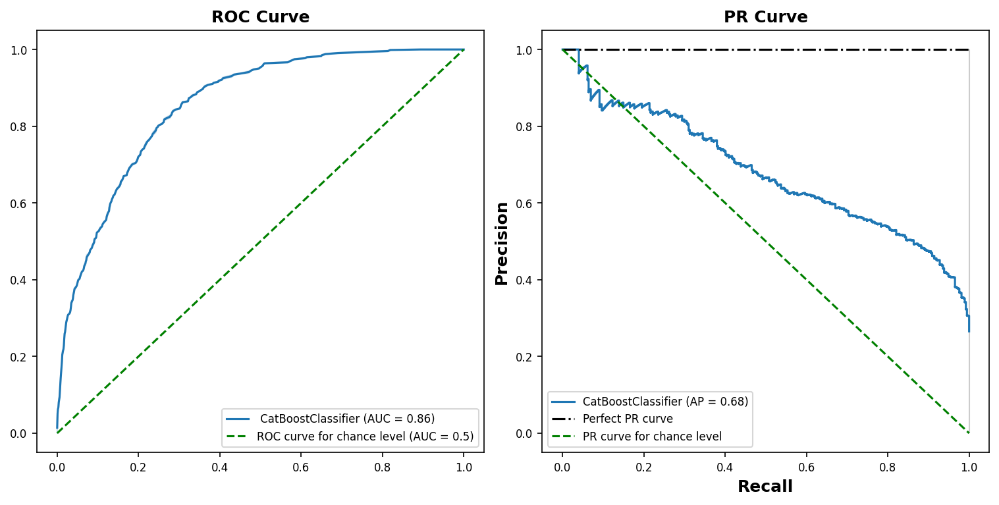

In [ ]:
classifier_cat = CatBoostClassifier(task_type = 'GPU', random_state=42, logging_level='Silent')

model(classifier_cat, x_train, y_train, x_test, y_test)

              precision    recall  f1-score   support

           0       0.83      0.91      0.87      1035
           1       0.67      0.50      0.57       374

    accuracy                           0.80      1409
   macro avg       0.75      0.71      0.72      1409
weighted avg       0.79      0.80      0.79      1409



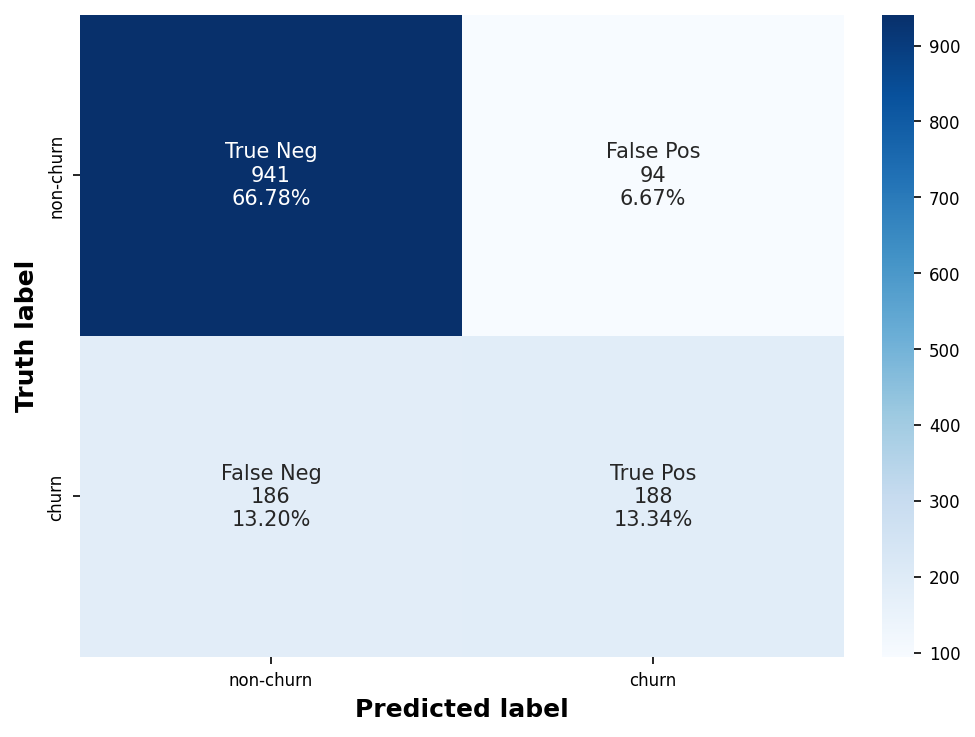

In [ ]:
model_evaluation(classifier_cat, x_test,y_test)

In [ ]:
cat_perf = model_label_metrics_report(classifier_cat, x_test, y_test)
cat_perf

,Accuracy,Recall,Precision,F1,Matthews Coef,ROC_AUC
0,0.801278,0.502674,0.666667,0.573171,0.454529,0.705926


### **Fine-tuned**

In [ ]:
# def objective(trial):
#   params = {
#       'iterations': trial.suggest_int('iterations', 1000, 4000),
#       "objective": trial.suggest_categorical("objective", ["Logloss", "CrossEntropy"]),
#       #"colsample_bylevel": trial.suggest_float("colsample_bylevel", 0.01, 0.1),
#       'boosting_type': trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
#       'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 1.0),
#       'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1, 100),
#       'bagging_temperature': trial.suggest_loguniform('bagging_temperature', 0.1, 20.0),
#       'random_strength': trial.suggest_float('random_strength', 1.0, 2.0),
#       'depth': trial.suggest_int('depth', 1, 10),
#       'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 1, 300),
#       # "use_best_model": True,
#       #"scale_pos_weight": trial.suggest_int('scale_pos_weight', 1, 5),
#   }

#   if params["objective"] == "Logloss":
#     params["scale_pos_weight"] = trial.suggest_int("scale_pos_weight", 1, 5)

#   model = CatBoostClassifier(**params, task_type = 'GPU', random_seed = 42)
#   # Assuming x_train and y_train are your data
#   # score = cross_val_score(model, x_train, y_train, cv = StratifiedKFold(n_splits = 5),
#   #                         scoring='recall', n_jobs = -1)
#   model.fit(x_train, y_train, verbose=False)#cat_features = cat_features, )
#   y_pred = model.predict(x_test)
#   return recall_score(y_test, y_pred)

# study = optuna.create_study(direction='maximize')
# study.optimize(objective, n_trials=20)

# print_info('Hyperparameter Tuning for CatBoost',
#            f'Best trial: {study.best_trial}',
#            f'Best value: {study.best_value}')

In [ ]:
# params = study.best_trial.params
params_cat = {'iterations': 2432, 'objective': 'Logloss', 'boosting_type': 'Ordered',
              'learning_rate': 0.14513237253061148, 'l2_leaf_reg': 11.05137269575293,
              'bagging_temperature': 2.7066945604878305, 'random_strength': 1.9664461619932763,
              'depth': 1, 'min_data_in_leaf': 284, 'scale_pos_weight': 5}

classifier_cat_tuned = CatBoostClassifier(**params_cat, task_type = 'GPU', random_seed=42)

ROC_AUC Score :  76.87%
Recall Score :  92.78%


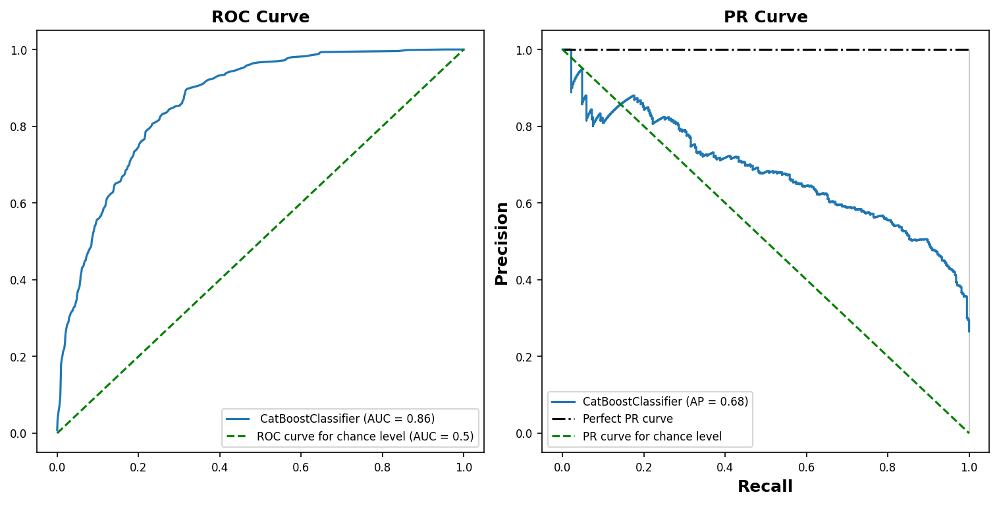

In [ ]:
model(classifier_cat_tuned, x_train, y_train, x_test, y_test, cross_validation = False)

              precision    recall  f1-score   support

           0       0.96      0.61      0.75      1035
           1       0.46      0.93      0.62       374

    accuracy                           0.69      1409
   macro avg       0.71      0.77      0.68      1409
weighted avg       0.83      0.69      0.71      1409



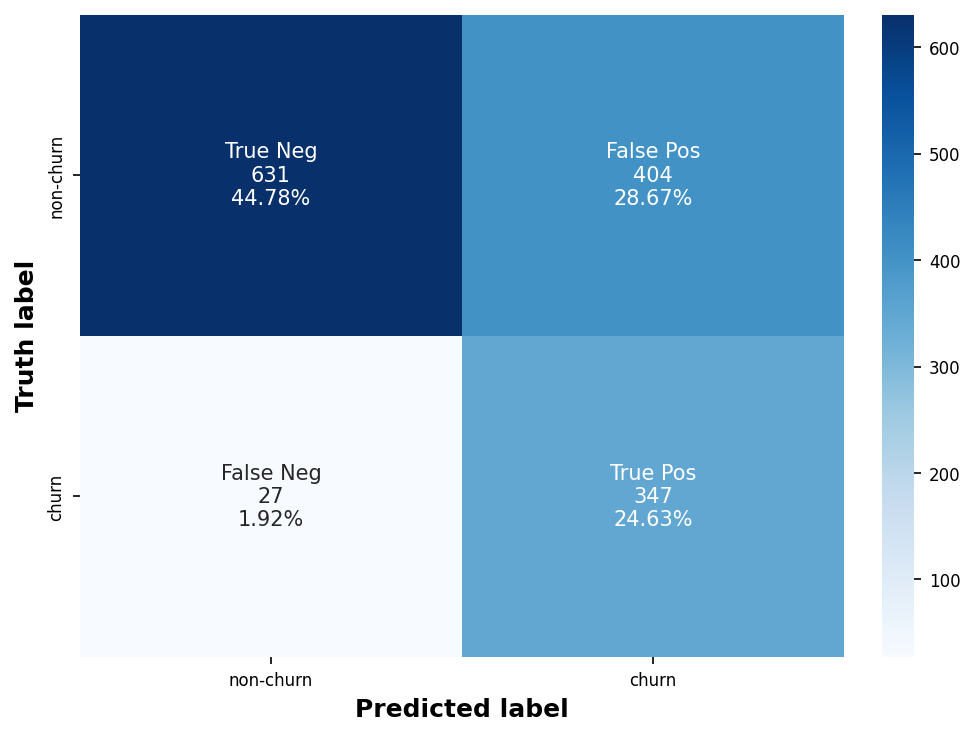

In [ ]:
model_evaluation(classifier_cat_tuned,x_test,y_test)

In [ ]:
cat_tuned_perf = model_label_metrics_report(classifier_cat_tuned, x_test, y_test)
cat_tuned_perf

,Accuracy,Recall,Precision,F1,Matthews Coef,ROC_AUC
0,0.694109,0.927807,0.462051,0.616889,0.475693,0.768735


We have achieved `recall` value of over **93%** with CatBoost tuned by Optuna. It indicates that we only miss 26 over 348 of the all churn customers, while this trade-off would increase number of false positives

In [ ]:
perf_all = pd.concat([rf_perf, rf_tuned_perf, xgb_perf, xgb_tuned_perf, cat_perf, cat_tuned_perf],
          keys = ['RF', 'RF Tuned', 'XGB', 'XGB Tuned', 'CatBoost', 'CatBoost Tuned']).reset_index(level = 0, names = ['Model']).reset_index(drop = True)

In [ ]:
perf_all.sort_values(by = ['Recall'], ascending=False)

,Model,Accuracy,Recall,Precision,F1,Matthews Coef,ROC_AUC
3,XGB Tuned,0.688432,0.927807,0.457181,0.612533,0.469236,0.764870
5,CatBoost Tuned,0.694109,0.927807,0.462051,0.616889,0.475693,0.768735
1,RF Tuned,0.768630,0.842246,0.541237,0.658996,0.523973,0.792137
4,CatBoost,0.801278,0.502674,0.666667,0.573171,0.454529,0.705926
2,XGB,0.787793,0.486631,0.629758,0.549020,0.419111,0.691625
0,RF,0.802697,0.419786,0.720183,0.530405,0.440603,0.680424


# **Calibrating Classifier**

## **Evaluating Classifiers without Calibrating**

In [ ]:
# Import calibration Framework
from pycaleva import CalibrationEvaluator

pred_prob_rf = classifier_rf_tuned.predict_proba(x_test)[:, 1]
pred_prob_xgb = classifier_xgb_tuned.predict_proba(x_test)[:, 1]
pred_prob_cat = classifier_cat_tuned.predict_proba(x_test)[:, 1]
# Initialze Calibration Framework
ce_rf = CalibrationEvaluator(y_test, pred_prob_rf, outsample=True, n_groups='auto')
ce_xgb = CalibrationEvaluator(y_test, pred_prob_xgb, outsample=True, n_groups='auto')
ce_cat = CalibrationEvaluator(y_test, pred_prob_cat, outsample=True, n_groups='auto')

In [ ]:
print_info('Calibration metrics',
        f'Random Forest - Values of metrics: {ce_rf.metrics()}',
        f'XGBoost - Values of metrics: {ce_xgb.metrics()}',
        f'CatBoost - Values of metrics: {ce_cat.metrics()}')

-------------------
Calibration metrics
-------------------
Random Forest - Values of metrics: metrics_result(auroc=0.8630602702213955, brier=0.15832224938499512, ace=0.1569185969056002, mce=0.27432786983336843, awlc=0.14002408649272463)
XGBoost - Values of metrics: metrics_result(auroc=0.8636931979642977, brier=0.20184130273953615, ace=0.24712848273389262, mce=0.41219677561420504, awlc=0.2396503656181443)
CatBoost - Values of metrics: metrics_result(auroc=0.863429693352967, brier=0.20148553599046135, ace=0.24285226599224255, mce=0.3825274939594362, awlc=0.2424820664444184)


We observe that all three classifiers displays some under-optimistic predidctions on the probabilities of positive class with random forest being the least vulnerable to this issue. Hence, we need to recalibrate the classifier, using **Isotonic regression** for example.

## **Recalibrating Classifiers**

In [ ]:
from sklearn.metrics import (brier_score_loss, precision_score, recall_score,
                             f1_score)

from sklearn.calibration import CalibratedClassifierCV, calibration_curve
def plot_calibration_curve(est, name, fig_index):
    """Plot calibration curve for est w/o and with calibration. """
    # Calibrated with isotonic calibration
    isotonic = CalibratedClassifierCV(est, cv=2, method='isotonic')

    # Calibrated with sigmoid calibration
    sigmoid = CalibratedClassifierCV(est, cv=2, method='sigmoid')

    # Logistic regression with no calibration as baseline
    lr = LogisticRegression(C=1., solver='lbfgs')

    fig = plt.figure(fig_index, figsize=(10, 10))
    ax1 = plt.subplot2grid((3, 1), (0, 0), rowspan=2)
    ax2 = plt.subplot2grid((3, 1), (2, 0))

    ax1.plot([0, 1], [0, 1], "k:", label="Perfectly calibrated")
    for clf, name in [(lr, 'Logistic'),
                      (est, name),
                      (isotonic, name + ' + Isotonic'),
                      (sigmoid, name + ' + Sigmoid')]:
        clf.fit(x_train, y_train, )
        y_pred = clf.predict(x_test)
        if hasattr(clf, "predict_proba"):
            prob_pos = clf.predict_proba(x_test)[:, 1]
        else:  # use decision function
            prob_pos = clf.decision_function(x_test)
            prob_pos = \
                (prob_pos - prob_pos.min()) / (prob_pos.max() - prob_pos.min())

        clf_score = brier_score_loss(y_test, prob_pos, pos_label= target.max())
        print("%s:" % name)
        print("\tBrier: %1.3f" % (clf_score))
        print("\tPrecision: %1.3f" % precision_score(y_test, y_pred))
        print("\tRecall: %1.3f" % recall_score(y_test, y_pred))
        print("\tF1: %1.3f\n" % f1_score(y_test, y_pred))

        fraction_of_positives, mean_predicted_value = \
            calibration_curve(y_test, prob_pos, n_bins=10)

        ax1.plot(mean_predicted_value, fraction_of_positives, "s-",
                 label="%s (%1.3f)" % (name, clf_score))

        ax2.hist(prob_pos, range=(0, 1), bins=10, label=name,
                 histtype="step", lw=2)

    ax1.set_ylabel("Fraction of positives")
    ax1.set_ylim([-0.05, 1.05])
    ax1.legend(loc="lower right")
    ax1.set_title('Calibration plots  (reliability curve)')

    ax2.set_xlabel("Mean predicted value")
    ax2.set_ylabel("Count")
    ax2.legend(loc="upper center", ncol=2)

    plt.tight_layout()


Logistic:
	Brier: 0.133
	Precision: 0.642
	Recall: 0.519
	F1: 0.574

Tuned RF:
	Brier: 0.158
	Precision: 0.541
	Recall: 0.842
	F1: 0.659

Tuned RF + Isotonic:
	Brier: 0.130
	Precision: 0.699
	Recall: 0.465
	F1: 0.559

Tuned RF + Sigmoid:
	Brier: 0.130
	Precision: 0.689
	Recall: 0.551
	F1: 0.612



<ipython-input-135-4ed8ae2b139c>:59: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


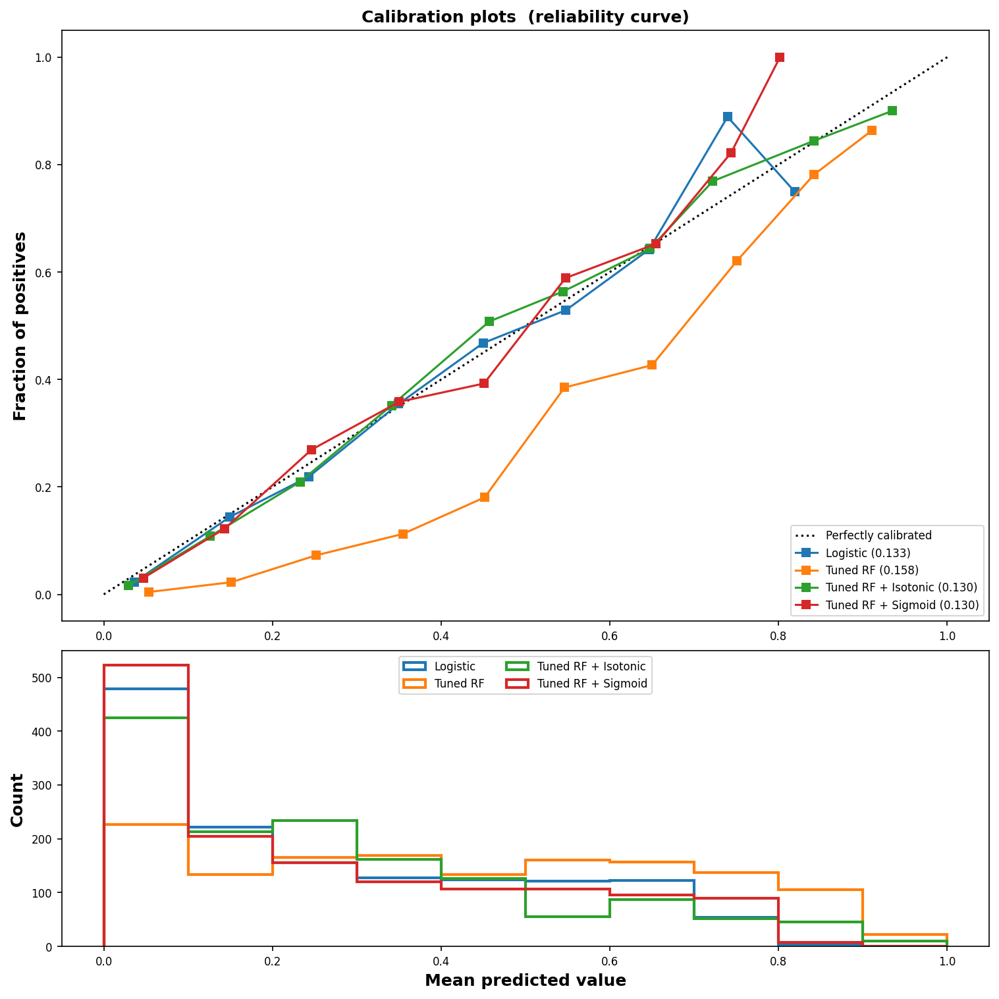

In [ ]:
plot_calibration_curve(classifier_rf_tuned, 'Tuned RF', 1)

Streaming output truncated to the last 5000 lines.
2308:	learn: 0.4333227	total: 1m 14s	remaining: 3.99s
2309:	learn: 0.4333221	total: 1m 14s	remaining: 3.96s
2310:	learn: 0.4332955	total: 1m 14s	remaining: 3.92s
2311:	learn: 0.4332955	total: 1m 14s	remaining: 3.89s
2312:	learn: 0.4332951	total: 1m 14s	remaining: 3.86s
2313:	learn: 0.4332951	total: 1m 14s	remaining: 3.82s
2314:	learn: 0.4332950	total: 1m 14s	remaining: 3.79s
2315:	learn: 0.4332944	total: 1m 15s	remaining: 3.76s
2316:	learn: 0.4332914	total: 1m 15s	remaining: 3.72s
2317:	learn: 0.4332912	total: 1m 15s	remaining: 3.69s
2318:	learn: 0.4332912	total: 1m 15s	remaining: 3.66s
2319:	learn: 0.4332861	total: 1m 15s	remaining: 3.62s
2320:	learn: 0.4332836	total: 1m 15s	remaining: 3.59s
2321:	learn: 0.4332752	total: 1m 15s	remaining: 3.56s
2322:	learn: 0.4332746	total: 1m 15s	remaining: 3.52s
2323:	learn: 0.4332746	total: 1m 15s	remaining: 3.49s
2324:	learn: 0.4332745	total: 1m 15s	remaining: 3.46s
2325:	learn: 0.4332745	total: 1

<ipython-input-135-4ed8ae2b139c>:59: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


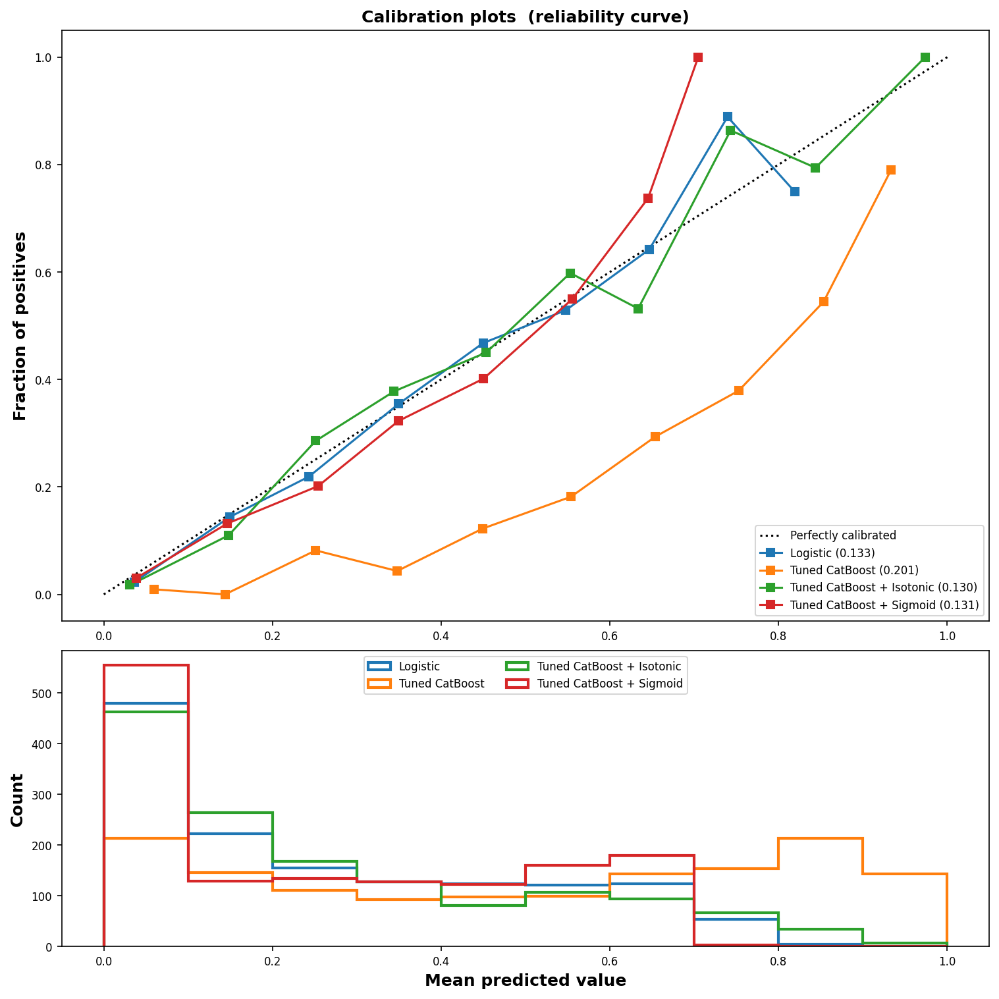

In [ ]:
plot_calibration_curve(classifier_cat_tuned, 'Tuned CatBoost', 1)

Logistic:
	Brier: 0.133
	Precision: 0.642
	Recall: 0.519
	F1: 0.574

Tuned XGBoost:
	Brier: 0.202
	Precision: 0.457
	Recall: 0.928
	F1: 0.613

Tuned XGBoost + Isotonic:
	Brier: 0.130
	Precision: 0.670
	Recall: 0.532
	F1: 0.593

Tuned XGBoost + Sigmoid:
	Brier: 0.131
	Precision: 0.662
	Recall: 0.607
	F1: 0.633



<ipython-input-135-4ed8ae2b139c>:59: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


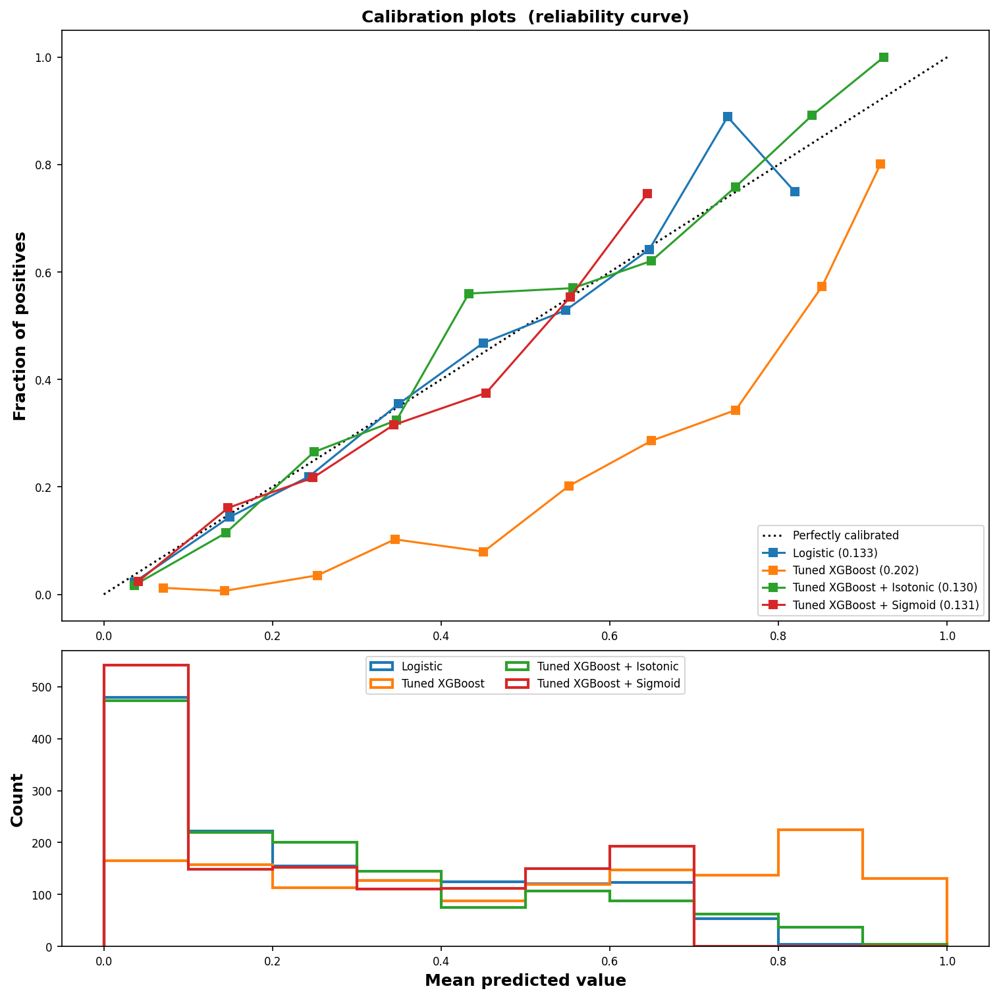

In [ ]:
plot_calibration_curve(classifier_xgb_tuned, 'Tuned XGBoost', 2)

# **Conclusion**

+ Three customer demographics should be the focus of our marketing efforts: senior citizens, individuals living with a partner, and those living alone.

+ Senior citizens, although fewer in number, tend to have a higher lower limit for monthly charges compared to other customer groups. This suggests that they are willing to pay a premium for high-quality service. Customers living with a partner or alone typically prefer services with monthly charges below $65.

+ To establish a robust customer base, the Telco Company should strive to make their services accessible and affordable. During the initial six months, the company should concentrate on enhancing online security, online backup, device protection, and tech support as these areas are crucial and often uncertain for customers. The company should aim to reduce the churn tenure of 40 - 50 months for these services.

+ Once a solid support service pipeline is established, the company should promote the use of multiple lines and fiber optic cables for phone and internet services respectively. However, the challenge lies in the starting point of $75+ in monthly charges for these two services.

+ The company should consider offering combinations of phone and internet services where the average monthly charges fall within the $100 - $120 range. For instance:
  * No Multiple Lines + Fiber Optic
  * Multiple Lines + DSL
This strategy could potentially increase average user income by eliminating the option of choosing a combination of No Multiple Lines + DSL, which typically has mean monthly charges of \$60 - \$70.

+ Streaming TV and movie services should be made more affordable and efforts should be made to reduce their churn tenure. The content of these services should cater to all customer types. This should be complemented by an easy and hassle-free payment method.

+ The company should consider discontinuing electronic checks due to their high churn rate and instead focus on automatic bank transfers and credit card payments. However, this approach presents the challenge of reducing the median churn tenure of above 20 months for these two payment methods, which is double the churn tenure of electronic checks.

+ The lower limit of electronic checks is around 60 whereas that of automatic bank transfers and credit card payments is around 20 in terms of monthly charges. Paperless billing is another costly feature with a starting point of 60 while other options start at 20 in terms of monthly charges.

+ Once the monthly charges for any single service reach the $70 mark, customers become very conscious about their expenses. Therefore, the quality of service should be the unique selling proposition (USP) of the Telco Company. Implementing these measures could potentially increase revenue and improve the current value delivery process.